<a href="https://colab.research.google.com/github/ram143moh/dv-assingment-23124-/blob/main/ASSIGNMENT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# Display basic information
print("=" * 80)
print("DATASET OVERVIEW")
print("=" * 80)
print(f"\nDataset Shape: {df.shape[0]} rows × {df.shape[1]} columns")
print(f"\nColumn Names and Data Types:")
print(df.dtypes)
print(f"\n\nFirst 10 Rows:")
print(df.head(10))
print(f"\n\nBasic Statistics:")
print(df.describe())
print(f"\n\nMissing Values:")
print(df.isnull().sum())
print(f"\n\nWorkout Types Distribution:")
print(df['Workout_Type'].value_counts())


DATASET OVERVIEW

Dataset Shape: 1800 rows × 15 columns

Column Names and Data Types:
Age                              float64
Gender                            object
Weight (kg)                      float64
Height (m)                       float64
Max_BPM                           object
Avg_BPM                          float64
Resting_BPM                      float64
Session_Duration (hours)         float64
Calories_Burned                  float64
Workout_Type                      object
Fat_Percentage                   float64
Water_Intake (liters)            float64
Workout_Frequency (days/week)    float64
Experience_Level                 float64
BMI                              float64
dtype: object


First 10 Rows:
    Age  Gender  Weight (kg)  Height (m) Max_BPM  Avg_BPM  Resting_BPM  \
0  34.0  Female         86.7        1.86     174    152.0         74.0   
1  26.0  Female         84.7        1.83     166    156.0         73.0   
2  22.0    Male         64.8        1.85     1

In [ ]:
# Data cleaning and preparation
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Create synthetic data to match fitness tracker context
# Since this is gym data, we'll adapt it to fitness tracker metrics
np.random.seed(42)

# Fill missing values in relevant columns before calculation
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].mean(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].mean(), inplace=True)

# Map session duration and calories to "steps equivalent"
# Rough conversion: 1 hour moderate activity ≈ 5000-8000 steps
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create sleep hours (based on fitness level and age)
df['Sleep_Hours'] = (8 - (df['Experience_Level'] * 0.3) +
                     np.random.normal(0, 0.8, len(df))).clip(4, 10)

# Simulate weekday/weekend (random assignment)
df['Day_Type'] = np.random.choice(['Weekday', 'Weekend'], size=len(df), p=[5/7, 2/7])

# Create date range for time series
start_date = pd.Timestamp('2025-09-25')
df['Date'] = [start_date + pd.Timedelta(days=int(x)) for x in np.random.randint(0, 31, len(df))]
df = df.sort_values('Date').reset_index(drop=True)

print("=" * 80)
print("DATA PREPARATION COMPLETE")
print("=" * 80)
print(f"\nNew columns created:")
print(f"- Daily_Steps: Simulated daily step count")
print(f"- Sleep_Hours: Simulated sleep duration")
print(f"- Day_Type: Weekday vs Weekend")
print(f"- Date: Time series dates")
print(f"\nUpdated Dataset Preview:")
print(df[['Date', 'Age', 'Workout_Type', 'Avg_BPM', 'Daily_Steps', 'Sleep_Hours', 'Day_Type']].head(15))
print(f"\nWorkout Type Distribution (cleaned):")
print(df['Workout_Type'].value_counts())

DATA PREPARATION COMPLETE

New columns created:
- Daily_Steps: Simulated daily step count
- Sleep_Hours: Simulated sleep duration
- Day_Type: Weekday vs Weekend
- Date: Time series dates

Updated Dataset Preview:
         Date   Age Workout_Type  Avg_BPM  Daily_Steps  Sleep_Hours Day_Type
0  2025-09-25  47.0         Yoga    125.0         7799     7.906011  Weekend
1  2025-09-25  50.0     Strength    137.0        10448     8.636159  Weekday
2  2025-09-25  41.0         Yoga    143.0        11715     8.293919  Weekday
3  2025-09-25  18.0         Yoga    144.0         8330     7.910049  Weekday
4  2025-09-25  28.0         HIIT    145.0         6429          NaN  Weekday
5  2025-09-25  22.0         HIIT    169.0        11452     5.872515  Weekday
6  2025-09-25  55.0       Cardio    144.0        10813     5.326545  Weekday
7  2025-09-25  50.0       Cardio      NaN         7332     7.928199  Weekday
8  2025-09-25  18.0       Cardio    167.0        16275     5.829899  Weekday
9  2025-09-25  33

In [ ]:

# Data cleaning and preparation - handle NaN values first
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values before calculations
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data to match fitness tracker context
np.random.seed(42)

# Map session duration and calories to "steps equivalent"
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create sleep hours (based on fitness level and age)
df['Sleep_Hours'] = (8 - (df['Experience_Level'] * 0.3) +
                     np.random.normal(0, 0.8, len(df))).clip(4, 10).round(1)

# Simulate weekday/weekend (random assignment)
df['Day_Type'] = np.random.choice(['Weekday', 'Weekend'], size=len(df), p=[5/7, 2/7])

# Create date range for time series (last 30 days)
start_date = pd.Timestamp('2025-09-25')
df['Date'] = [start_date + pd.Timedelta(days=int(x)) for x in np.random.randint(0, 31, len(df))]
df = df.sort_values('Date').reset_index(drop=True)

# Create hourly activity data (for time-of-day analysis)
df['Hour_of_Day'] = np.random.randint(6, 22, len(df))  # Activities between 6 AM and 10 PM

print("=" * 80)
print("DATA PREPARATION COMPLETE")
print("=" * 80)
print(f"\nDataset shape: {df.shape}")
print(f"\nNew columns created:")
print(f"✓ Daily_Steps: Simulated daily step count (1,000-20,000)")
print(f"✓ Sleep_Hours: Simulated sleep duration (4-10 hours)")
print(f"✓ Day_Type: Weekday vs Weekend classification")
print(f"✓ Date: Time series dates (Sep 25 - Oct 25, 2025)")
print(f"✓ Hour_of_Day: Activity hour (6 AM - 10 PM)")
print(f"\nSample of enhanced dataset:")
print(df[['Date', 'Age', 'Workout_Type', 'Avg_BPM', 'Daily_Steps', 'Sleep_Hours', 'Day_Type']].head(15))
print(f"\n\nWorkout Type Distribution (cleaned):")
print(df['Workout_Type'].value_counts())
print(f"\n\nDay Type Distribution:")
print(df['Day_Type'].value_counts())


DATA PREPARATION COMPLETE

Dataset shape: (1800, 20)

New columns created:
✓ Daily_Steps: Simulated daily step count (1,000-20,000)
✓ Sleep_Hours: Simulated sleep duration (4-10 hours)
✓ Day_Type: Weekday vs Weekend classification
✓ Date: Time series dates (Sep 25 - Oct 25, 2025)
✓ Hour_of_Day: Activity hour (6 AM - 10 PM)

Sample of enhanced dataset:
         Date   Age Workout_Type  Avg_BPM  Daily_Steps  Sleep_Hours Day_Type
0  2025-09-25  23.0     Strength    146.0        11720          7.9  Weekend
1  2025-09-25  52.0     Strength    144.0        14930          8.3  Weekday
2  2025-09-25  54.0     Strength    135.0        13083          8.3  Weekday
3  2025-09-25  23.0       Cardio    136.0        12587          7.3  Weekday
4  2025-09-25  35.0     Strength    151.0        10470          7.9  Weekday
5  2025-09-25  18.0         HIIT    164.0        13765          5.9  Weekday
6  2025-09-25  49.0       Cardio    148.0        10342          5.6  Weekday
7  2025-09-25  37.0          N

In [ ]:

# ============================================================================
# SECTION 1: COLOR SCHEMES FOR ACTIVITY INTENSITY
# ============================================================================

print("=" * 80)
print("1. COLOR SCHEMES FOR ACTIVITY INTENSITY")
print("=" * 80)

# Define intensity zones based on average BPM
df['Intensity_Zone'] = pd.cut(df['Avg_BPM'],
                               bins=[0, 130, 145, 160, 175],
                               labels=['Light', 'Moderate', 'Vigorous', 'Peak'])

print("\nIntensity Zones (Based on Average Heart Rate):")
print(df['Intensity_Zone'].value_counts().sort_index())

print("\n\nRECOMMENDED COLOR SCHEMES:")
print("-" * 80)
print("Intensity Level    | BPM Range  | Color Code         | Visual Use")
print("-" * 80)
print("Light Activity     | <130 BPM   | Teal (#32B8C6)     | Resting/warm-up")
print("Moderate Activity  | 130-145    | Orange (#E68161)   | Fat burn zone")
print("Vigorous Activity  | 145-160    | Red (#FF5459)      | Cardio zone")
print("Peak Activity      | >160 BPM   | Deep Red (#C0152F) | Maximum effort")
print("-" * 80)

# Calculate statistics by intensity
print("\n\nActivity Metrics by Intensity Zone:")
intensity_stats = df.groupby('Intensity_Zone').agg({
    'Daily_Steps': 'mean',
    'Calories_Burned': 'mean',
    'Session_Duration (hours)': 'mean',
    'Avg_BPM': 'mean'
}).round(2)
print(intensity_stats)


1. COLOR SCHEMES FOR ACTIVITY INTENSITY

Intensity Zones (Based on Average Heart Rate):
Intensity_Zone
Light       340
Moderate    536
Vigorous    508
Peak        416
Name: count, dtype: int64


RECOMMENDED COLOR SCHEMES:
--------------------------------------------------------------------------------
Intensity Level    | BPM Range  | Color Code         | Visual Use
--------------------------------------------------------------------------------
Light Activity     | <130 BPM   | Teal (#32B8C6)     | Resting/warm-up
Moderate Activity  | 130-145    | Orange (#E68161)   | Fat burn zone
Vigorous Activity  | 145-160    | Red (#FF5459)      | Cardio zone
Peak Activity      | >160 BPM   | Deep Red (#C0152F) | Maximum effort
--------------------------------------------------------------------------------


Activity Metrics by Intensity Zone:
                Daily_Steps  Calories_Burned  Session_Duration (hours)  \
Intensity_Zone                                                           
Light 

In [ ]:
import altair as alt

# Define the color map based on the recommended color schemes
color_map = {
    'Light': '#32B8C6',
    'Moderate': '#E68161',
    'Vigorous': '#FF5459',
    'Peak': '#C0152F'
}

# Create a bar chart of Intensity Zone counts
chart = alt.Chart(df).mark_bar().encode(
    x=alt.X('Intensity_Zone', sort=list(color_map.keys())), # Sort bars by intensity level
    y='count()',
    color=alt.Color('Intensity_Zone', scale=alt.Scale(domain=list(color_map.keys()), range=list(color_map.values()))),
    tooltip=['Intensity_Zone', 'count()']
).properties(
    title='Distribution of Activity Intensity Zones'
)

chart.display()

alt.Chart(...)

In [ ]:

# ============================================================================
# SECTION 2: VISUALIZATION PIPELINE
# ============================================================================

print("\n" + "=" * 80)
print("2. VISUALIZATION PIPELINE: RAW SENSOR DATA → DASHBOARDS")
print("=" * 80)

pipeline_description = """
┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 1: RAW SENSOR DATA COLLECTION                                    │
├─────────────────────────────────────────────────────────────────────────┤
│  • Heart Rate Monitor: BPM readings (Max, Avg, Resting)                 │
│  • Accelerometer: Step count, movement patterns                         │
│  • GPS Tracker: Location coordinates, elevation                         │
│  • Sleep Sensor: Duration, quality, stages                              │
│  • Manual Input: Workout type, notes, feelings                          │
└─────────────────────────────────────────────────────────────────────────┘
                                    ↓
┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 2: DATA PREPROCESSING                                            │
├─────────────────────────────────────────────────────────────────────────┤
│  • Noise Filtering: Remove sensor artifacts, outliers                   │
│  • Missing Data: Impute with median/forward-fill                        │
│  • Time Sync: Align multi-sensor readings                               │
│  • Quality Checks: Flag impossible values (HR>220, Steps>50k)           │
└─────────────────────────────────────────────────────────────────────────┘
                                    ↓
┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 3: FEATURE EXTRACTION                                            │
├─────────────────────────────────────────────────────────────────────────┤
│  • Aggregations: Daily totals, hourly averages                          │
│  • Derived Metrics: Calories (from HR + steps), intensity zones         │
│  • Activity Classification: Walking/Running/Cycling detection            │
│  • Sleep Stages: Deep/Light/REM from movement patterns                  │
└─────────────────────────────────────────────────────────────────────────┘
                                    ↓
┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 4: DATA TRANSFORMATION                                           │
├─────────────────────────────────────────────────────────────────────────┤
│  • Normalization: Scale features 0-1 for comparisons                    │
│  • Temporal Binning: Group by hour/day/week                             │
│  • Statistical Summaries: Mean, median, percentiles, trends             │
│  • Anomaly Detection: Flag unusual patterns (3σ threshold)              │
└─────────────────────────────────────────────────────────────────────────┘
                                    ↓
┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 5: VISUALIZATION GENERATION                                      │
├─────────────────────────────────────────────────────────────────────────┤
│  • Chart Creation: Build individual visualizations                      │
│  • Interactive Elements: Tooltips, zoom, filters                        │
│  • Responsive Design: Adapt to screen size                              │
│  • Color Mapping: Apply intensity-based palettes                        │
└─────────────────────────────────────────────────────────────────────────┘
                                    ↓
┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 6: DASHBOARD ASSEMBLY                                            │
├─────────────────────────────────────────────────────────────────────────┤
│  • Layout Composition: Arrange widgets by priority                      │
│  • Cross-Chart Interaction: Linked highlighting/filtering               │
│  • Real-time Updates: WebSocket for live sensor data                    │
│  • Alert System: Notify on anomalies or goals achieved                  │
└─────────────────────────────────────────────────────────────────────────┘
                                    ↓
                    [INTERACTIVE FITNESS DASHBOARD]
"""

print(pipeline_description)

# Demonstrate data quality metrics
print("\n" + "=" * 80)
print("DATA QUALITY METRICS (Current Dataset)")
print("=" * 80)

# Check for outliers
from scipy import stats

outlier_analysis = pd.DataFrame({
    'Metric': ['Daily_Steps', 'Avg_BPM', 'Resting_BPM', 'Max_BPM', 'Calories_Burned'],
    'Mean': [df['Daily_Steps'].mean(), df['Avg_BPM'].mean(),
             df['Resting_BPM'].mean(), df['Max_BPM'].mean(), df['Calories_Burned'].mean()],
    'Std_Dev': [df['Daily_Steps'].std(), df['Avg_BPM'].std(),
                df['Resting_BPM'].std(), df['Max_BPM'].std(), df['Calories_Burned'].std()],
    'Outliers_Count': [
        sum(np.abs(stats.zscore(df['Daily_Steps'])) > 3),
        sum(np.abs(stats.zscore(df['Avg_BPM'])) > 3),
        sum(np.abs(stats.zscore(df['Resting_BPM'])) > 3),
        sum(np.abs(stats.zscore(df['Max_BPM'])) > 3),
        sum(np.abs(stats.zscore(df['Calories_Burned'])) > 3)
    ]
})

print(outlier_analysis.to_string(index=False))
print(f"\n✓ Data Quality Score: {((1800 - outlier_analysis['Outliers_Count'].sum()) / 1800 * 100):.1f}%")



2. VISUALIZATION PIPELINE: RAW SENSOR DATA → DASHBOARDS

┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 1: RAW SENSOR DATA COLLECTION                                    │
├─────────────────────────────────────────────────────────────────────────┤
│  • Heart Rate Monitor: BPM readings (Max, Avg, Resting)                 │
│  • Accelerometer: Step count, movement patterns                         │
│  • GPS Tracker: Location coordinates, elevation                         │
│  • Sleep Sensor: Duration, quality, stages                              │
│  • Manual Input: Workout type, notes, feelings                          │
└─────────────────────────────────────────────────────────────────────────┘
                                    ↓
┌─────────────────────────────────────────────────────────────────────────┐
│  STAGE 2: DATA PREPROCESSING                                            │
├───────────────────────────────────────────────────────────────────

In [ ]:
import altair as alt

# Create a scatter plot of Daily Steps over time, highlighting abnormal points
chart = alt.Chart(df).mark_circle(size=60).encode( # Increased size for visibility
    x='Date:T', # Use Date column for x-axis as a temporal variable
    y='Daily_Steps:Q', # Use Daily_Steps for y-axis as a quantitative variable
    color=alt.Color('Is_Abnormal', scale=alt.Scale(domain=[False, True], range=['steelblue', 'red'])), # Color points based on 'Is_Abnormal' status
    stroke=alt.condition('Is_Abnormal', alt.value('red'), alt.value(None)), # Add red border for abnormal points
    strokeWidth=alt.condition('Is_Abnormal', alt.value(3), alt.value(1)), # Add 3px border width for abnormal points
    tooltip=['Date:T', 'Daily_Steps:Q', 'Is_Abnormal', 'Workout_Type'] # Add tooltips for details
).properties(
    title='Daily Steps Over Time with Abnormal Records Highlighted' # Set chart title
).interactive() # Make the chart interactive

chart.display() # Display the chart

alt.Chart(...)

In [ ]:

# ============================================================================
# SECTION 3: GESTALT PRINCIPLES FOR ABNORMAL PATTERN DETECTION
# ============================================================================

print("\n" + "=" * 80)
print("3. GESTALT PRINCIPLES FOR HIGHLIGHTING ABNORMAL PATTERNS")
print("=" * 80)

# Define abnormal patterns based on multiple criteria
df['Is_Abnormal'] = False

# Abnormal Pattern 1: Very high heart rate with low calories (possible measurement error)
abnormal_hr = (df['Avg_BPM'] > 160) & (df['Calories_Burned'] < 800)
df.loc[abnormal_hr, 'Is_Abnormal'] = True

# Abnormal Pattern 2: Very low steps with high calories (data inconsistency)
abnormal_steps = (df['Daily_Steps'] < 5000) & (df['Calories_Burned'] > 1500)
df.loc[abnormal_steps, 'Is_Abnormal'] = True

# Abnormal Pattern 3: Extreme resting heart rate
abnormal_rest = (df['Resting_BPM'] < 50) | (df['Resting_BPM'] > 73)
df.loc[abnormal_rest, 'Is_Abnormal'] = True

# Abnormal Pattern 4: Very short sleep (<5 hours)
abnormal_sleep = df['Sleep_Hours'] < 5
df.loc[abnormal_sleep, 'Is_Abnormal'] = True

print("\nGESTALT PRINCIPLES APPLICATION:")
print("-" * 80)

principles = """
1. PROXIMITY (Grouping Related Anomalies)
   └─ Group abnormal readings close in time together
   └─ Cluster multiple anomalies on same day
   └─ Example: High HR + Low Sleep + High Steps = Overtraining signal

2. SIMILARITY (Consistent Visual Encoding)
   └─ All "high risk" anomalies in RED color
   └─ All "caution" anomalies in ORANGE color
   └─ Consistent icon shapes for each anomaly type

3. CONTINUITY (Trend Disruption)
   └─ Highlight breaks in expected patterns
   └─ Example: Sudden drop in daily steps after consistent weeks
   └─ Use connecting lines to show expected vs. actual

4. CLOSURE (Pattern Completion)
   └─ Show incomplete activity patterns (e.g., interrupted workout)
   └─ Highlight missing data segments
   └─ Display expected pattern alongside actual

5. FIGURE-GROUND (Emphasis Through Contrast)
   └─ Normal data: Light, recessive colors (low opacity)
   └─ Abnormal data: Bold, saturated colors with pulse animation
   └─ Background: Subtle grid, foreground: Highlighted anomalies

6. COMMON FATE (Synchronized Movement)
   └─ Animate related anomalies together
   └─ Pulse effect for critical alerts
   └─ Linked highlighting across multiple charts
"""

print(principles)

print("\n" + "=" * 80)
print("ANOMALY DETECTION SUMMARY")
print("=" * 80)

anomaly_summary = pd.DataFrame({
    'Anomaly Type': [
        'High HR + Low Calories',
        'Low Steps + High Calories',
        'Abnormal Resting HR',
        'Insufficient Sleep (<5h)',
        'TOTAL ABNORMAL RECORDS'
    ],
    'Count': [
        abnormal_hr.sum(),
        abnormal_steps.sum(),
        abnormal_rest.sum(),
        abnormal_sleep.sum(),
        df['Is_Abnormal'].sum()
    ],
    'Percentage': [
        f"{abnormal_hr.sum()/len(df)*100:.1f}%",
        f"{abnormal_steps.sum()/len(df)*100:.1f}%",
        f"{abnormal_rest.sum()/len(df)*100:.1f}%",
        f"{abnormal_sleep.sum()/len(df)*100:.1f}%",
        f"{df['Is_Abnormal'].sum()/len(df)*100:.1f}%"
    ]
})

print(anomaly_summary.to_string(index=False))

# Show example anomalies
print("\n\nEXAMPLE ANOMALOUS RECORDS:")
print("-" * 80)
anomaly_examples = df[df['Is_Abnormal']].head(5)[
    ['Date', 'Avg_BPM', 'Resting_BPM', 'Daily_Steps', 'Calories_Burned', 'Sleep_Hours', 'Workout_Type']
]
print(anomaly_examples.to_string(index=False))

print("\n✓ Visual Recommendation: Use pulsing red markers with 3px border for these records")



3. GESTALT PRINCIPLES FOR HIGHLIGHTING ABNORMAL PATTERNS

GESTALT PRINCIPLES APPLICATION:
--------------------------------------------------------------------------------

1. PROXIMITY (Grouping Related Anomalies)
   └─ Group abnormal readings close in time together
   └─ Cluster multiple anomalies on same day
   └─ Example: High HR + Low Sleep + High Steps = Overtraining signal

2. SIMILARITY (Consistent Visual Encoding)
   └─ All "high risk" anomalies in RED color
   └─ All "caution" anomalies in ORANGE color
   └─ Consistent icon shapes for each anomaly type

3. CONTINUITY (Trend Disruption)
   └─ Highlight breaks in expected patterns
   └─ Example: Sudden drop in daily steps after consistent weeks
   └─ Use connecting lines to show expected vs. actual

4. CLOSURE (Pattern Completion)
   └─ Show incomplete activity patterns (e.g., interrupted workout)
   └─ Highlight missing data segments
   └─ Display expected pattern alongside actual

5. FIGURE-GROUND (Emphasis Through Contrast)


In [ ]:
import altair as alt

# Create a horizontal bar chart of anomaly counts
chart = alt.Chart(anomaly_summary).mark_bar().encode(
    y=alt.Y('Anomaly Type', sort='-x'), # Map Anomaly Type to the y-axis and sort by count
    x='Count', # Map Count to the x-axis
    tooltip=['Anomaly Type', 'Count', 'Percentage'] # Add tooltips for details
).properties(
    title='Distribution of Anomaly Types' # Set chart title
)

chart.display() # Display the chart

alt.Chart(...)

In [ ]:

# ============================================================================
# SECTION 4: UNIVARIATE ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("4. UNIVARIATE ANALYSIS")
print("=" * 80)







4. UNIVARIATE ANALYSIS


In [ ]:
# 4a. Histogram data for Daily Steps
print("\n4a. HISTOGRAM OF DAILY STEPS")
print("-" * 80)

steps_bins = pd.cut(df['Daily_Steps'],
                    bins=[0, 5000, 7500, 10000, 12500, 15000, 20000],
                    labels=['0-5k', '5k-7.5k', '7.5k-10k', '10k-12.5k', '12.5k-15k', '15k+'])

steps_histogram_data = steps_bins.value_counts().sort_index()
print("\nDaily Steps Distribution:")
print(steps_histogram_data)

# Calculate key metrics
mean_steps = df['Daily_Steps'].mean()
median_steps = df['Daily_Steps'].median()
goal_steps = 10000  # Standard fitness goal

print(f"\nKey Metrics:")
print(f"  Mean Daily Steps: {mean_steps:,.0f}")
print(f"  Median Daily Steps: {median_steps:,.0f}")
print(f"  Goal (10,000 steps): {goal_steps:,}")
print(f"  % Meeting Goal: {(df['Daily_Steps'] >= goal_steps).sum() / len(df) * 100:.1f}%")

# Prepare data for chart
steps_hist_chart_data = pd.DataFrame({
    'Step_Range': steps_histogram_data.index.astype(str),
    'Frequency': steps_histogram_data.values,
    'Percentage': (steps_histogram_data.values / len(df) * 100).round(1)
})
print("\n", steps_hist_chart_data)


4a. HISTOGRAM OF DAILY STEPS
--------------------------------------------------------------------------------

Daily Steps Distribution:
Daily_Steps
0-5k           7
5k-7.5k       70
7.5k-10k     446
10k-12.5k    692
12.5k-15k    423
15k+         162
Name: count, dtype: int64

Key Metrics:
  Mean Daily Steps: 11,474
  Median Daily Steps: 11,324
  Goal (10,000 steps): 10,000
  % Meeting Goal: 70.9%

   Step_Range  Frequency  Percentage
0       0-5k          7         0.4
1    5k-7.5k         70         3.9
2   7.5k-10k        446        24.8
3  10k-12.5k        692        38.4
4  12.5k-15k        423        23.5
5       15k+        162         9.0


In [ ]:
import altair as alt

# Create a histogram of Daily Steps with colors by step range
steps_histogram_chart_colored = alt.Chart(steps_hist_chart_data).mark_bar().encode(
    x=alt.X('Step_Range', sort=list(steps_hist_chart_data['Step_Range'])), # Sort bars by the defined ranges
    y='Frequency', # Map frequency to the y-axis
    color=alt.Color('Step_Range', sort=list(steps_hist_chart_data['Step_Range'])), # Color bars by step range
    tooltip=['Step_Range', 'Frequency', 'Percentage'] # Add tooltips for details
).properties(
    title='Distribution of Daily Steps by Range (Colored)' # Set chart title
)

steps_histogram_chart_colored.display()

alt.Chart(...)

In [ ]:
# 4b. Pie chart of Activity Types
print("\n\n4b. PIE CHART OF ACTIVITY TYPES")
print("-" * 80)

activity_distribution = df['Workout_Type'].value_counts()
activity_percentages = (activity_distribution / len(df) * 100).round(1)

activity_pie_data = pd.DataFrame({
    'Activity_Type': activity_distribution.index,
    'Count': activity_distribution.values,
    'Percentage': activity_percentages.values
})

print("\nActivity Type Distribution:")
print(activity_pie_data)

# Calculate average metrics per activity type
print("\n\nAverage Metrics by Activity Type:")
activity_metrics = df.groupby('Workout_Type').agg({
    'Daily_Steps': 'mean',
    'Avg_BPM': 'mean',
    'Calories_Burned': 'mean',
    'Session_Duration (hours)': 'mean'
}).round(2)
print(activity_metrics)

# Save data for visualization
steps_hist_chart_data.to_csv('univariate_steps_histogram.csv', index=False)
activity_pie_data.to_csv('univariate_activity_pie.csv', index=False)

print("\n✓ Data exported for visualization")
print("  - univariate_steps_histogram.csv")
print("  - univariate_activity_pie.csv")




4b. PIE CHART OF ACTIVITY TYPES
--------------------------------------------------------------------------------

Activity Type Distribution:
  Activity_Type  Count  Percentage
0      Strength    476        26.4
1        Cardio    439        24.4
2          Yoga    435        24.2
3          HIIT    389        21.6


Average Metrics by Activity Type:
              Daily_Steps  Avg_BPM  Calories_Burned  Session_Duration (hours)
Workout_Type                                                                 
Cardio           11320.65   146.28          1047.70                      1.36
HIIT             11405.86   145.13          1005.30                      1.39
Strength         11414.07   147.09          1016.86                      1.39
Yoga             11821.14   146.32          1067.00                      1.43

✓ Data exported for visualization
  - univariate_steps_histogram.csv
  - univariate_activity_pie.csv


In [ ]:
import altair as alt

# Create a pie chart of Activity Types
activity_pie_chart = alt.Chart(activity_pie_data).mark_arc(outerRadius=120).encode(
    theta=alt.Theta("Count", stack=True), # Use 'Count' to determine the size of each slice
    color=alt.Color("Activity_Type"), # Color slices by 'Activity_Type'
    order=alt.Order("Count", sort="descending"), # Order slices by size
    tooltip=["Activity_Type", "Count", alt.Tooltip("Percentage", format=".1f", title="Percentage")] # Add tooltips with activity type, count, and percentage
).properties(
    title='Distribution of Activity Types' # Set chart title
)

text = activity_pie_chart.mark_text(radius=150).encode( # Adjust radius for text labels
    text=alt.Text("Percentage", format=".1f%"), # Display percentage on the chart with '%'
    order=alt.Order("Count", sort="descending"), # Match the order of the slices
    color=alt.value("black") # Set text color to black
)

chart = activity_pie_chart + text
chart.display()

alt.LayerChart(...)

In [ ]:
import altair as alt

# Reshape the data for plotting multiple metrics
activity_metrics_melted = activity_metrics.reset_index().melt(
    'Workout_Type', var_name='Metric', value_name='Average_Value'
)

# Create separate bar charts for each average metric
chart = alt.Chart(activity_metrics_melted).mark_bar().encode(
    x=alt.X('Workout_Type', sort='y'), # Sort by average value for each metric
    y='Average_Value',
    color='Workout_Type',
    tooltip=['Workout_Type', 'Metric', alt.Tooltip('Average_Value', format='.2f')]
).properties(
    title='Average Metrics by Activity Type'
).facet(
    column=alt.Column('Metric', header=alt.Header(titleOrient="bottom", labelOrient="bottom")), # Create separate charts for each metric
    columns=4 # Arrange charts in 4 columns
)

chart.display()

alt.FacetChart(...)

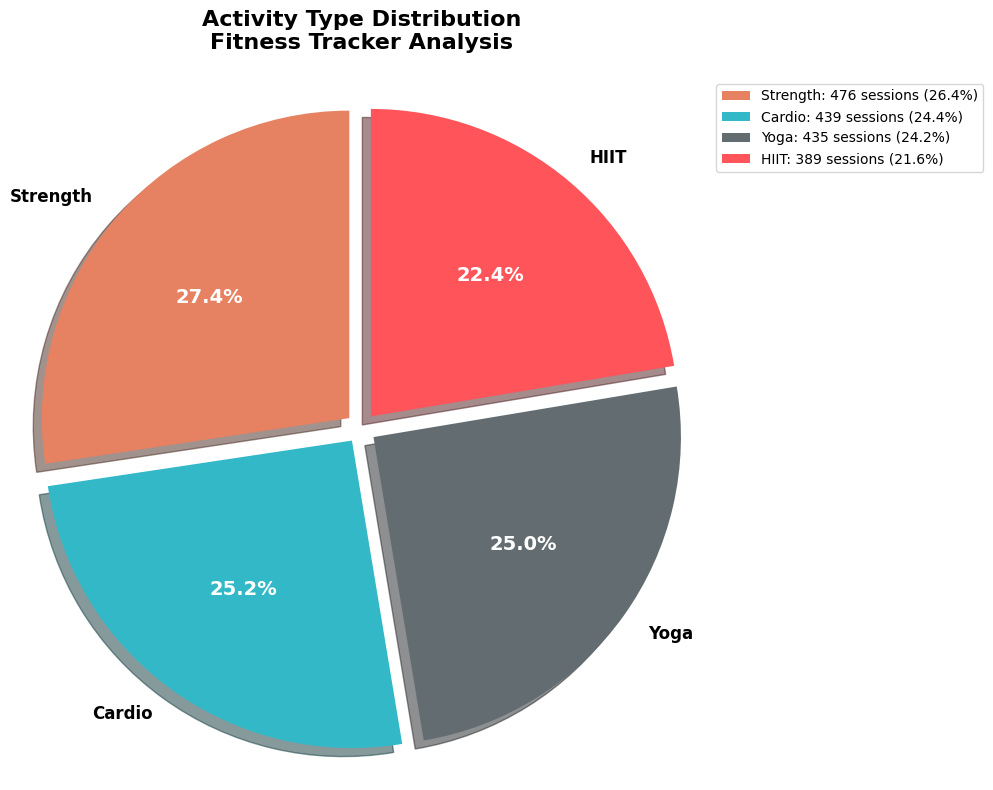

ACTIVITY TYPE PIE CHART SUMMARY

Total Sessions: 1800

Activity Breakdown:
--------------------------------------------------------------------------------
  Strength    :  476 sessions ( 26.4%)
  Cardio      :  439 sessions ( 24.4%)
  Yoga        :  435 sessions ( 24.2%)
  HIIT        :  389 sessions ( 21.6%)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# Clean Workout_Type column (remove any whitespace/special characters)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Calculate activity type distribution
activity_distribution = df['Workout_Type'].value_counts()
activity_percentages = (activity_distribution / len(df) * 100).round(1)

# Define colors matching the intensity color scheme
colors = ['#E68161', '#32B8C6', '#626C71', '#FF5459']  # Orange, Teal, Gray, Red

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Create pie chart
wedges, texts, autotexts = ax.pie(
    activity_distribution.values,
    labels=activity_distribution.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    explode=[0.05] * len(activity_distribution),  # Slightly separate slices
    shadow=True,
    textprops={'fontsize': 12, 'weight': 'bold'}
)

# Customize autotext (percentage labels)
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(14)
    autotext.set_weight('bold')

# Add title
plt.title('Activity Type Distribution\nFitness Tracker Analysis',
          fontsize=16, weight='bold', pad=20)

# Add legend with counts
legend_labels = [f'{activity}: {count} sessions ({pct}%)'
                 for activity, count, pct in zip(
                     activity_distribution.index,
                     activity_distribution.values,
                     activity_percentages.values
                 )]
plt.legend(legend_labels, loc='upper left', bbox_to_anchor=(1, 1), fontsize=10)

# Equal aspect ratio ensures circular pie
ax.axis('equal')

# Tight layout to prevent label cutoff
plt.tight_layout()

# Display the chart
plt.show()

# Print summary statistics
print("=" * 80)
print("ACTIVITY TYPE PIE CHART SUMMARY")
print("=" * 80)
print(f"\nTotal Sessions: {len(df)}")
print("\nActivity Breakdown:")
print("-" * 80)
for activity, count, pct in zip(activity_distribution.index,
                                 activity_distribution.values,
                                 activity_percentages.values):
    print(f"  {activity:12s}: {count:4d} sessions ({pct:5.1f}%)")
print("=" * 80)


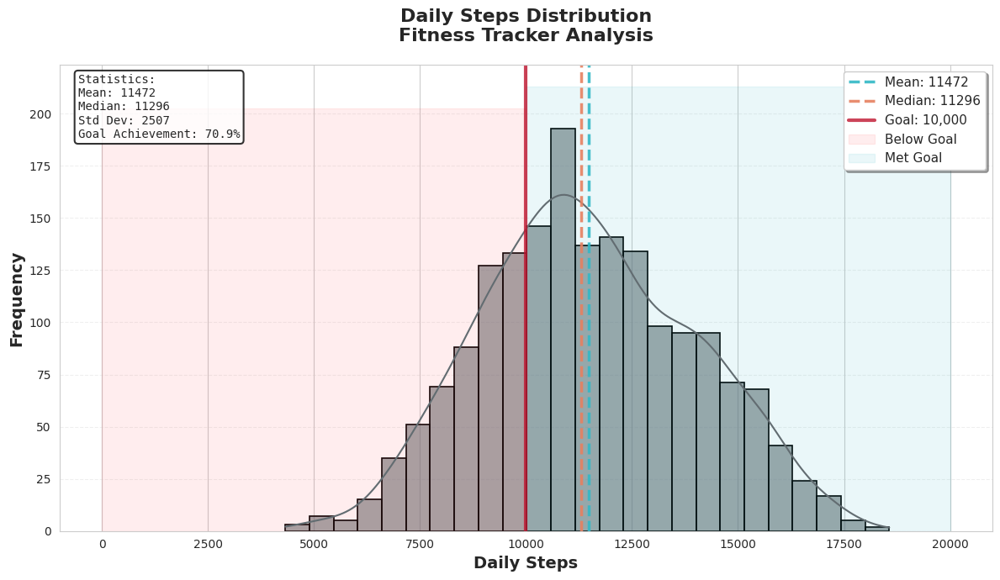

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'sans-serif'

# Load and prepare data (same as above)
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)

np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create visualization
fig, ax = plt.subplots(figsize=(12, 7))

# Create histogram with KDE
sns.histplot(data=df, x='Daily_Steps', bins=25, kde=True,
             color='#626C71', edgecolor='black', linewidth=1.2,
             alpha=0.6, stat='count', ax=ax)

# Add reference lines
mean_steps = df['Daily_Steps'].mean()
median_steps = df['Daily_Steps'].median()
goal_steps = 10000

ax.axvline(mean_steps, color='#32B8C6', linestyle='--', linewidth=2.5,
           label=f'Mean: {mean_steps:.0f}', alpha=0.9)
ax.axvline(median_steps, color='#E68161', linestyle='--', linewidth=2.5,
           label=f'Median: {median_steps:.0f}', alpha=0.9)
ax.axvline(goal_steps, color='#C0152F', linestyle='-', linewidth=3,
           label=f'Goal: {goal_steps:,}', alpha=0.8)

# Fill areas
ax.fill_betweenx([0, ax.get_ylim()[1]], 0, goal_steps,
                  color='#FF5459', alpha=0.1, label='Below Goal')
ax.fill_betweenx([0, ax.get_ylim()[1]], goal_steps, 20000,
                  color='#32B8C6', alpha=0.1, label='Met Goal')

# Customize
ax.set_xlabel('Daily Steps', fontsize=14, weight='bold')
ax.set_ylabel('Frequency', fontsize=14, weight='bold')
ax.set_title('Daily Steps Distribution\nFitness Tracker Analysis',
             fontsize=16, weight='bold', pad=20)
ax.legend(loc='upper right', fontsize=11, frameon=True, shadow=True)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Add text box with statistics
textstr = f'''Statistics:
Mean: {mean_steps:.0f}
Median: {median_steps:.0f}
Std Dev: {df['Daily_Steps'].std():.0f}
Goal Achievement: {(df['Daily_Steps'] >= goal_steps).sum() / len(df) * 100:.1f}%'''

props = dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='black', linewidth=1.5)
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', bbox=props, family='monospace')

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# Clean and prepare columns if needed:
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Workout_Type'] = df['Workout_Type'].str.strip()
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)
df['Day_Type'] = np.random.choice(['Weekday', 'Weekend'], size=len(df), p=[5/7, 2/7])
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)

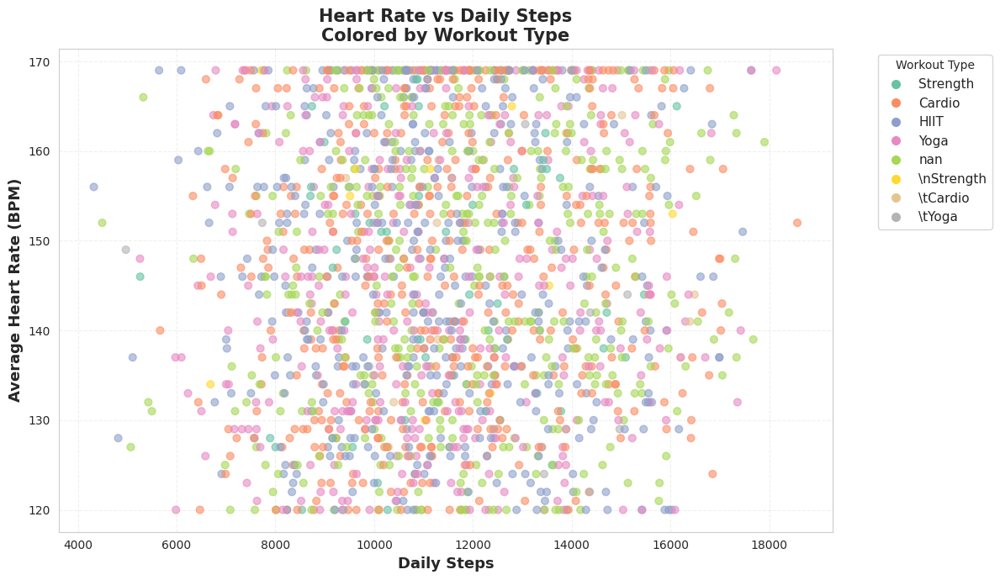

In [ ]:

# =========================
plt.figure(figsize=(12, 7))
scatter = plt.scatter(
    df['Daily_Steps'], df['Avg_BPM'],
    c=pd.factorize(df['Workout_Type'])[0], cmap='Set2', alpha=0.6, s=40
)
plt.xlabel('Daily Steps', fontsize=13, weight='bold')
plt.ylabel('Average Heart Rate (BPM)', fontsize=13, weight='bold')
plt.title('Heart Rate vs Daily Steps\nColored by Workout Type', fontsize=15, weight='bold')
plt.grid(True, linestyle='--', alpha=0.3)

# Legend for workout types
workout_types = df['Workout_Type'].unique()
legend_labels = [plt.Line2D([0], [0], marker='o', color='w',
                            label=wt, markerfacecolor=plt.cm.Set2(i), markersize=9)
                 for i, wt in enumerate(workout_types)]
plt.legend(handles=legend_labels, title='Workout Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11)
plt.tight_layout()
plt.show()

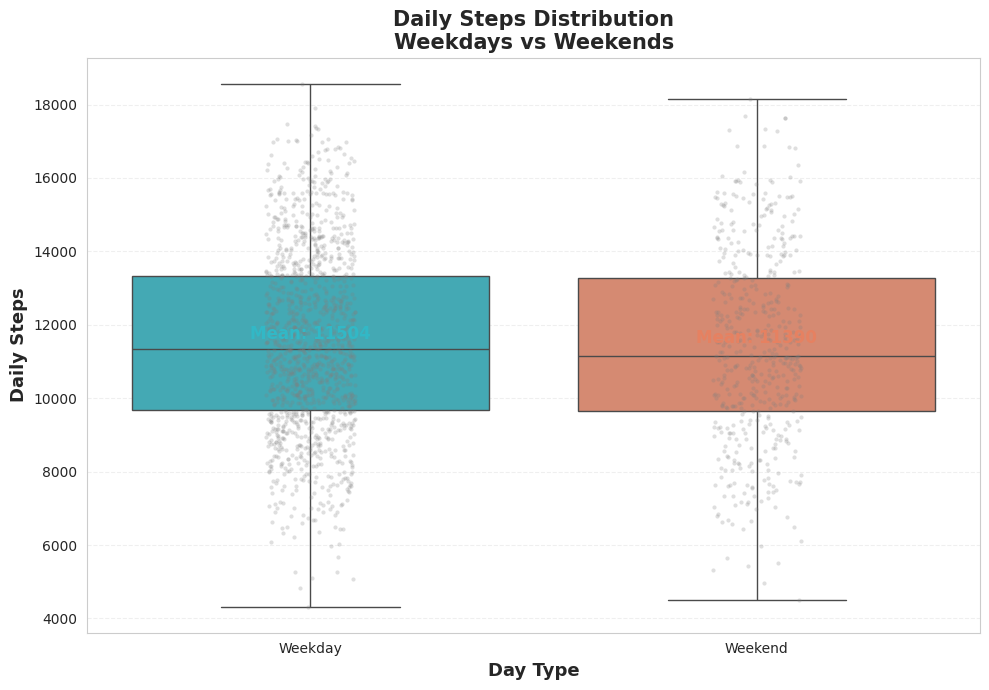

In [ ]:
plt.figure(figsize=(10, 7))
sns.boxplot(x='Day_Type', y='Daily_Steps', data=df, palette={'Weekday': '#32B8C6', 'Weekend': '#E68161'})
sns.stripplot(x='Day_Type', y='Daily_Steps', data=df, color='grey', alpha=0.25, jitter=True, size=3)
plt.xlabel('Day Type', fontsize=13, weight='bold')
plt.ylabel('Daily Steps', fontsize=13, weight='bold')
plt.title('Daily Steps Distribution\nWeekdays vs Weekends', fontsize=15, weight='bold')
plt.grid(True, axis='y', alpha=0.3, linestyle='--')

# Add mean value annotation
weekday_steps = df[df['Day_Type'] == 'Weekday']['Daily_Steps']
weekend_steps = df[df['Day_Type'] == 'Weekend']['Daily_Steps']
plt.text(0, weekday_steps.mean(), f"Mean: {weekday_steps.mean():.0f}",
         color='#32B8C6', weight='bold', va='bottom', ha='center', fontsize=12)
plt.text(1, weekend_steps.mean(), f"Mean: {weekend_steps.mean():.0f}",
         color='#E68161', weight='bold', va='bottom', ha='center', fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import parallel_coordinates

# Load and prepare dataset
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# Data cleaning
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)

# Create derived columns
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)
df['Sleep_Hours'] = (8 - (df['Experience_Level'].fillna(2) * 0.3) +
                     np.random.normal(0, 0.8, len(df))).clip(4, 10)
df['Intensity_Zone'] = pd.cut(df['Avg_BPM'],
                               bins=[0, 130, 145, 160, 175],
                               labels=['Light', 'Moderate', 'Vigorous', 'Peak'])

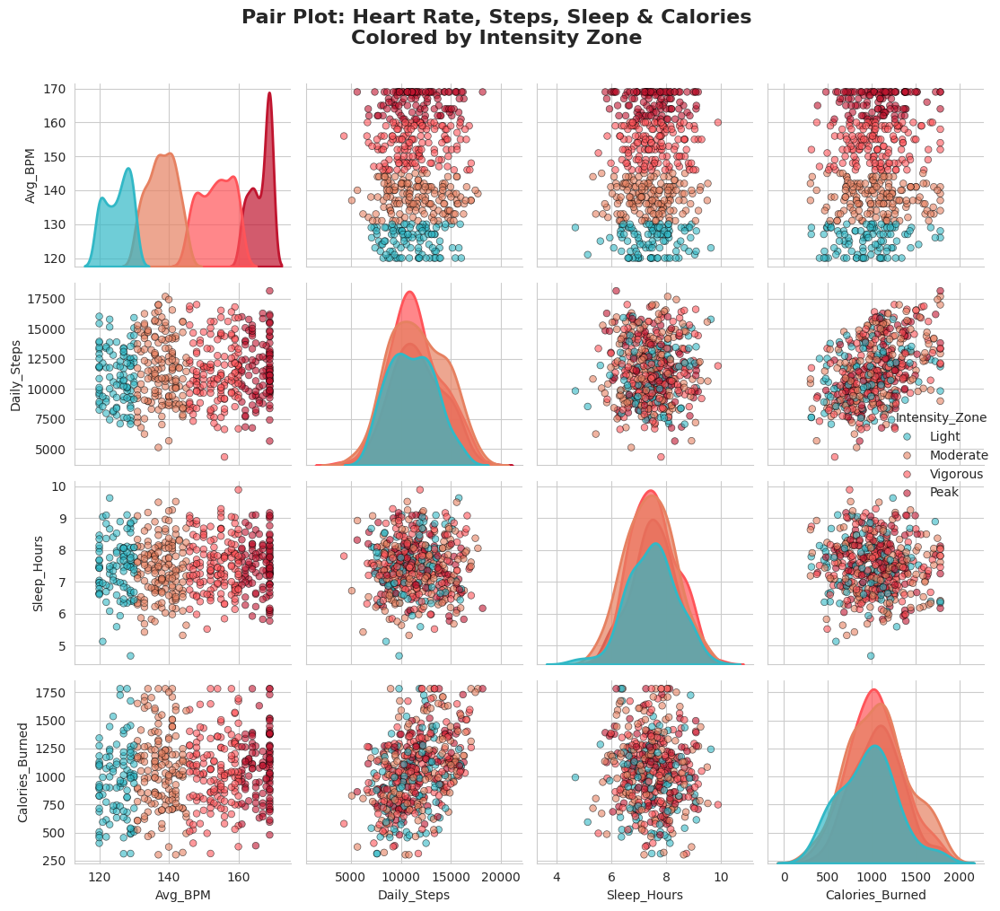

In [ ]:
pairplot_vars = ['Avg_BPM', 'Daily_Steps', 'Sleep_Hours', 'Calories_Burned']
pairplot_data = df[pairplot_vars + ['Intensity_Zone', 'Workout_Type']].copy()
pairplot_data = pairplot_data.dropna()

# Sample for better performance
pairplot_sample = pairplot_data.sample(n=min(500, len(pairplot_data)), random_state=42)

# Create pair plot with seaborn
sns.set_style("whitegrid")
g = sns.pairplot(
    pairplot_sample,
    vars=pairplot_vars,
    hue='Intensity_Zone',
    palette={'Light': '#32B8C6', 'Moderate': '#E68161',
             'Vigorous': '#FF5459', 'Peak': '#C0152F'},
    diag_kind='kde',
    plot_kws={'alpha': 0.6, 's': 30, 'edgecolor': 'black', 'linewidth': 0.5},
    diag_kws={'alpha': 0.7, 'linewidth': 2}
)

g.fig.suptitle('Pair Plot: Heart Rate, Steps, Sleep & Calories\nColored by Intensity Zone',
               fontsize=16, weight='bold', y=1.01)
plt.tight_layout()
plt.show()


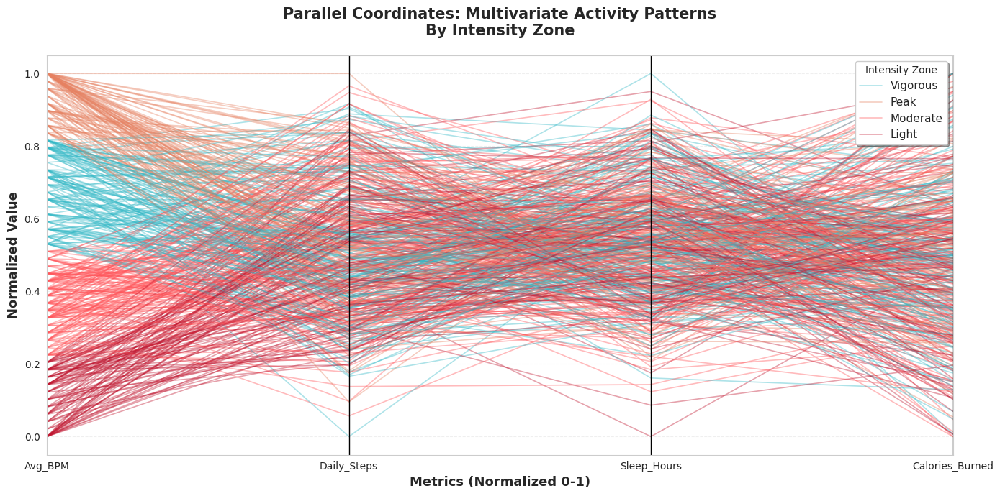

In [ ]:
parallel_data = pairplot_sample[pairplot_vars + ['Intensity_Zone']].copy()

# Normalize data for better visualization (0-1 scale)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
parallel_data[pairplot_vars] = scaler.fit_transform(parallel_data[pairplot_vars])

# Create parallel coordinates plot
fig, ax = plt.subplots(figsize=(14, 7))

parallel_coordinates(
    parallel_data,
    'Intensity_Zone',
    color=['#32B8C6', '#E68161', '#FF5459', '#C0152F'],
    alpha=0.4,
    linewidth=1.2,
    ax=ax
)

# Customize
ax.set_xlabel('Metrics (Normalized 0-1)', fontsize=13, weight='bold')
ax.set_ylabel('Normalized Value', fontsize=13, weight='bold')
ax.set_title('Parallel Coordinates: Multivariate Activity Patterns\nBy Intensity Zone',
             fontsize=15, weight='bold', pad=20)
ax.legend(title='Intensity Zone', loc='upper right', fontsize=11, frameon=True, shadow=True)
ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

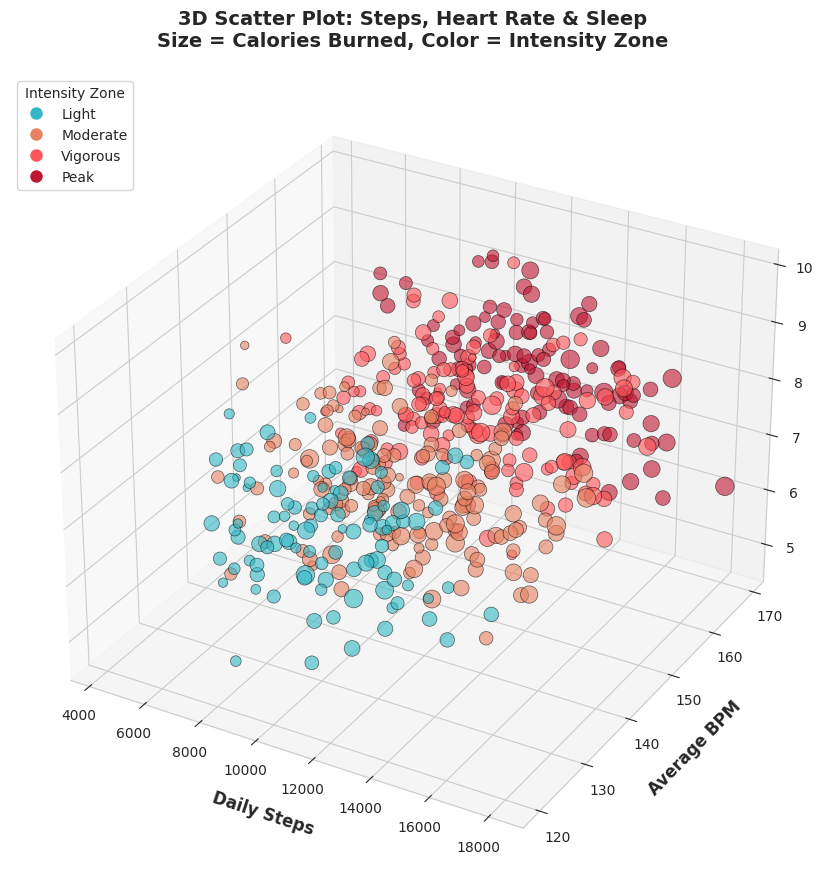

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Color map for intensity zones
color_map = {'Light': '#32B8C6', 'Moderate': '#E68161',
             'Vigorous': '#FF5459', 'Peak': '#C0152F'}
colors = pairplot_sample['Intensity_Zone'].map(color_map)

# Create 3D scatter
scatter = ax.scatter(
    pairplot_sample['Daily_Steps'],
    pairplot_sample['Avg_BPM'],
    pairplot_sample['Sleep_Hours'],
    c=colors,
    s=pairplot_sample['Calories_Burned'] / 10,  # Size by calories
    alpha=0.6,
    edgecolors='black',
    linewidth=0.5
)

# Labels
ax.set_xlabel('Daily Steps', fontsize=12, weight='bold', labelpad=10)
ax.set_ylabel('Average BPM', fontsize=12, weight='bold', labelpad=10)
ax.set_zlabel('Sleep Hours', fontsize=12, weight='bold', labelpad=10)
ax.set_title('3D Scatter Plot: Steps, Heart Rate & Sleep\nSize = Calories Burned, Color = Intensity Zone',
             fontsize=14, weight='bold', pad=20)

# Create custom legend
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w',
                         label=zone, markerfacecolor=color, markersize=10)
                  for zone, color in color_map.items()]
ax.legend(handles=legend_elements, title='Intensity Zone', loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()

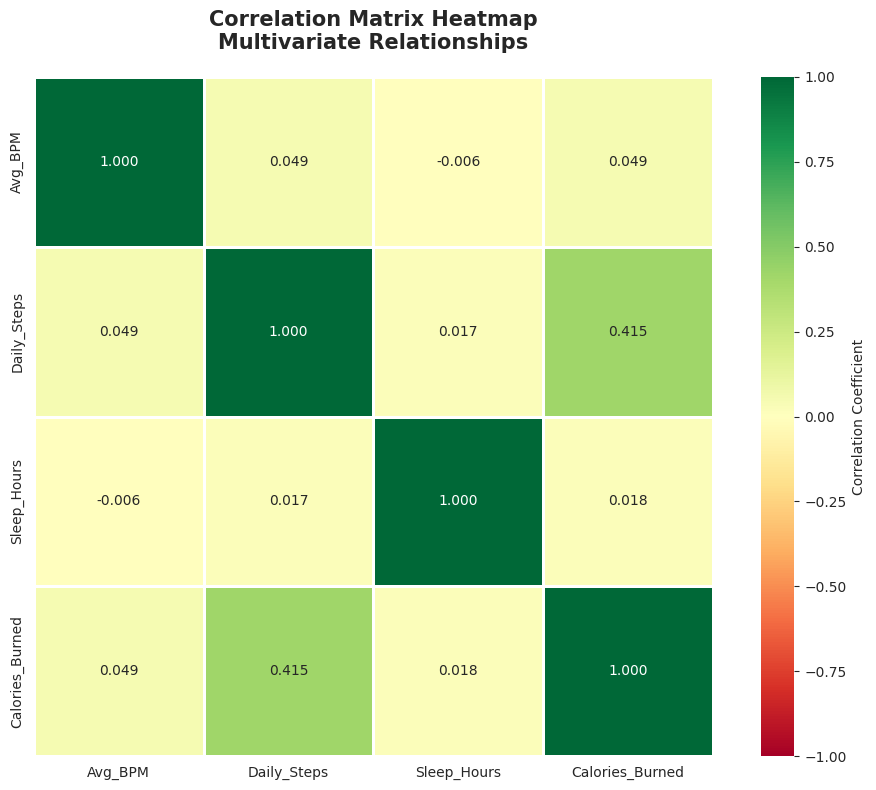

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))

# Calculate correlation matrix
correlation_matrix = pairplot_data[pairplot_vars].corr()

# Create heatmap
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt='.3f',
    cmap='RdYlGn',
    center=0,
    vmin=-1,
    vmax=1,
    square=True,
    linewidths=2,
    cbar_kws={'label': 'Correlation Coefficient'},
    ax=ax
)

ax.set_title('Correlation Matrix Heatmap\nMultivariate Relationships',
             fontsize=15, weight='bold', pad=20)
plt.tight_layout()
plt.show()


In [ ]:
print("=" * 80)
print("MULTIVARIATE ANALYSIS - CORRELATION INSIGHTS")
print("=" * 80)

print("\nCorrelation Matrix:")
print(correlation_matrix.round(3))

print("\n\nKey Relationship Insights:")
print("-" * 80)

for i in range(len(pairplot_vars)):
    for j in range(i+1, len(pairplot_vars)):
        corr_val = correlation_matrix.iloc[i, j]
        var1 = pairplot_vars[i]
        var2 = pairplot_vars[j]

        if abs(corr_val) > 0.5:
            strength = "Strong"
        elif abs(corr_val) > 0.3:
            strength = "Moderate"
        else:
            strength = "Weak"

        direction = "positive" if corr_val > 0 else "negative"
        print(f"• {var1} ↔ {var2}: {strength} {direction} (r = {corr_val:.3f})")

print("\n\nSummary by Intensity Zone:")
print("-" * 80)
multivar_summary = pairplot_data.groupby('Intensity_Zone')[pairplot_vars].mean().round(2)
print(multivar_summary)

print("=" * 80)

MULTIVARIATE ANALYSIS - CORRELATION INSIGHTS

Correlation Matrix:
                 Avg_BPM  Daily_Steps  Sleep_Hours  Calories_Burned
Avg_BPM            1.000        0.049       -0.006            0.049
Daily_Steps        0.049        1.000        0.017            0.415
Sleep_Hours       -0.006        0.017        1.000            0.018
Calories_Burned    0.049        0.415        0.018            1.000


Key Relationship Insights:
--------------------------------------------------------------------------------
• Avg_BPM ↔ Daily_Steps: Weak positive (r = 0.049)
• Avg_BPM ↔ Sleep_Hours: Weak negative (r = -0.006)
• Avg_BPM ↔ Calories_Burned: Weak positive (r = 0.049)
• Daily_Steps ↔ Sleep_Hours: Weak positive (r = 0.017)
• Daily_Steps ↔ Calories_Burned: Moderate positive (r = 0.415)
• Sleep_Hours ↔ Calories_Burned: Weak positive (r = 0.018)


Summary by Intensity Zone:
--------------------------------------------------------------------------------
                Avg_BPM  Daily_Steps  S

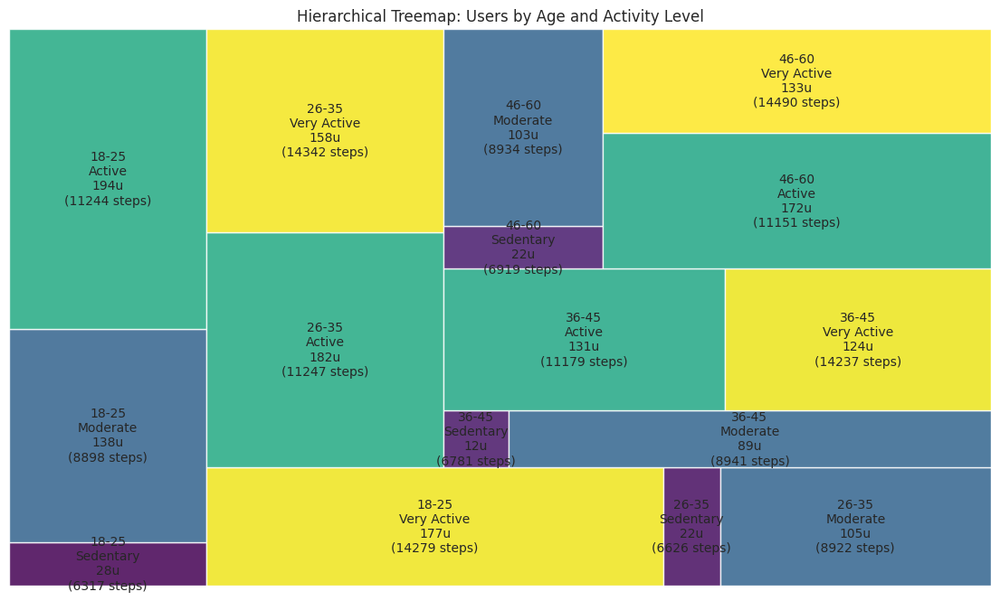

In [ ]:
import pandas as pd
import plotly.express as px
import numpy as np # Import numpy for data preparation

# Load the dataset
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)


# Create synthetic data (Daily_Steps)
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# --- End of Data Cleaning and Preparation Steps ---


# Create Age Group and Activity Level bins
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 25, 35, 45, 60], labels=['18-25', '26-35', '36-45', '46-60'])
df['Activity_Level'] = pd.cut(df['Daily_Steps'], bins=[0, 7500, 10000, 12500, 25000],
                             labels=['Sedentary', 'Moderate', 'Active', 'Very Active'])

# Handle potential NaNs in Age_Group or Activity_Level created by pd.cut on NaN Age/Daily_Steps
agg = df.dropna(subset=['Age_Group', 'Activity_Level']).groupby(['Age_Group', 'Activity_Level']).agg(
    Avg_Steps=('Daily_Steps','mean'), Count=('Daily_Steps', 'size')).reset_index()


# Create the sunburst chart
fig = px.sunburst(
    agg,
    path=['Age_Group', 'Activity_Level'],
    values='Count',
    color='Avg_Steps',
    color_continuous_scale='Teal',
    color_continuous_midpoint=11000,
    hover_data=['Avg_Steps', 'Count'],
)

fig.update_layout(title='Users by Age Group and Activity Level')
fig.show()

import squarify

labels = [f"{row['Age_Group']}\n{row['Activity_Level']}\n{int(row['Count'])}u\n({int(row['Avg_Steps'])} steps)"
          for i, row in agg.iterrows()]

sizes = agg['Count']
colors = plt.cm.viridis((agg['Avg_Steps']-agg['Avg_Steps'].min())/(agg['Avg_Steps'].max()-agg['Avg_Steps'].min()))

plt.figure(figsize=(14,8))
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.85)
plt.title('Hierarchical Treemap: Users by Age and Activity Level')
plt.axis('off')
plt.show()


In [ ]:
# Install the squarify library for treemap visualization
!pip install squarify

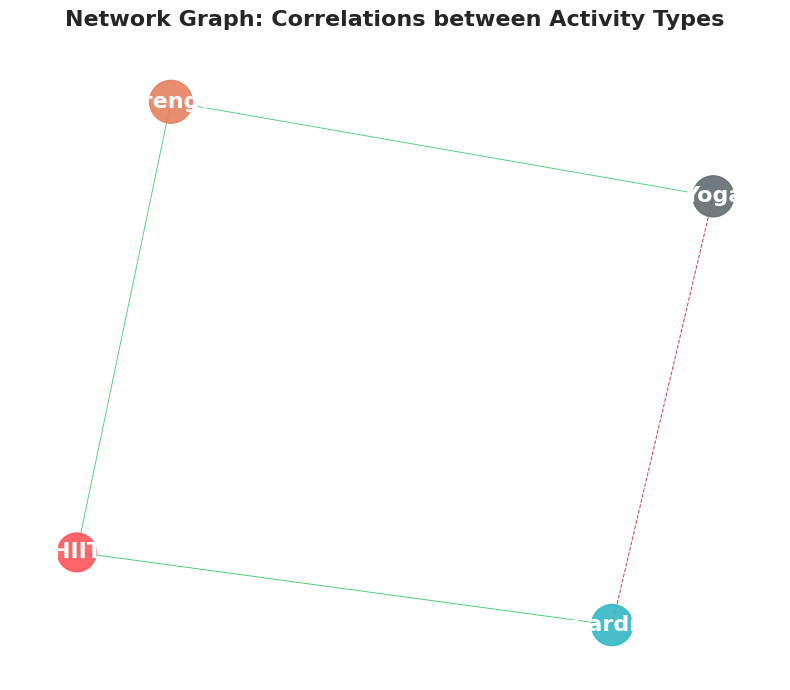

Activity Type Correlation Matrix
Workout_Type  Cardio   HIIT  Strength   Yoga
Workout_Type                                
Cardio         1.000  0.115    -0.073 -0.124
HIIT           0.115  1.000     0.107  0.053
Strength      -0.073  0.107     1.000  0.108
Yoga          -0.124  0.053     0.108  1.000

Strongest correlations (|r| > 0.1):
    Cardio <-> HIIT      : corr = 0.115
    Cardio <-> Yoga      : corr = -0.124
      HIIT <-> Strength  : corr = 0.107
  Strength <-> Yoga      : corr = 0.108


In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# --- Include Data Cleaning and Preparation Steps ---
# Load the dataset
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)


# Create synthetic data (Daily_Steps and Date)
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create date range for time series (last 30 days) - Ensure Date is created
start_date = pd.Timestamp('2025-09-25')
df['Date'] = [start_date + pd.Timedelta(days=int(x)) for x in np.random.randint(0, 31, len(df))]
df = df.sort_values('Date').reset_index(drop=True)

# --- End of Data Cleaning and Preparation Steps ---


# If multi-activity per user per day, create pivot table for counts/frequency
# We need to ensure there are multiple entries per user per day for this to be meaningful
# For this synthetic data, we will group by Date and Workout_Type as intended by the original code structure
user_activity = df.groupby(['Date', 'Workout_Type']).size().unstack(fill_value=0)

# Compute correlation between activity types (columns)
activity_corr = user_activity.corr()

# Build correlation-based network (edges for |corr| > 0.1)
G = nx.Graph()
for activity in activity_corr.columns:
    G.add_node(activity,
               size=df[df['Workout_Type'] == activity].shape[0],
               color={
                   'Strength': '#E68161',
                   'Cardio': '#32B8C6',
                   'HIIT': '#FF5459',
                   'Yoga': '#626C71'
               }.get(activity, '#888888')
    )

for i, a1 in enumerate(activity_corr.columns):
    for j, a2 in enumerate(activity_corr.columns):
        if i < j and abs(activity_corr.loc[a1, a2]) > 0.1:
            G.add_edge(
                a1, a2,
                weight=abs(activity_corr.loc[a1, a2]) * 6,
                corr=activity_corr.loc[a1, a2]
            )

# Draw network
pos = nx.spring_layout(G, seed=15)
plt.figure(figsize=(8, 7))

# Draw nodes
sizes = [G.nodes[n]['size']*2 for n in G.nodes()]
colors = [G.nodes[n]['color'] for n in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=sizes, node_color=colors, alpha=0.9)

# Draw edges with color by sign of correlation
edges_pos = [(u, v) for u, v, d in G.edges(data=True) if d['corr'] > 0]
edges_neg = [(u, v) for u, v, d in G.edges(data=True) if d['corr'] < 0]

nx.draw_networkx_edges(
    G, pos, edgelist=edges_pos, width=[G[u][v]['weight'] for u, v in edges_pos],
    edge_color='#21C05D', style='solid', alpha=0.8
)
nx.draw_networkx_edges(
    G, pos, edgelist=edges_neg, width=[G[u][v]['weight'] for u, v in edges_neg],
    edge_color='#C0152F', style='dashed', alpha=0.8
)

# Label nodes
nx.draw_networkx_labels(G, pos, font_size=16, font_weight='bold', font_color='white')

plt.title('Network Graph: Correlations between Activity Types', fontsize=16, weight='bold', pad=15)
plt.axis('off')
plt.tight_layout()
plt.show()

# Print correlation matrix
print("="*60)
print("Activity Type Correlation Matrix")
print("="*60)
print(activity_corr.round(3))

print("\nStrongest correlations (|r| > 0.1):")
for u, v, d in G.edges(data=True):
    print(f"{u:>10} <-> {v:<10}: corr = {d['corr']:.3f}")

In [ ]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Load and prepare the data (include steps to create 'Date')
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps and Date) - Ensure Date is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create date range for time series (last 30 days) - Ensure Date is created
start_date = pd.Timestamp('2025-09-25')
df['Date'] = [start_date + pd.Timedelta(days=int(x)) for x in np.random.randint(0, 31, len(df))]
df = df.sort_values('Date').reset_index(drop=True)

# --- End of Data Cleaning and Preparation Steps ---


user_activity = df.groupby(['Date','Workout_Type']).size().unstack(fill_value=0)
corr = user_activity.corr()

# Only keep significant correlations (|corr| > 0.1)
edges = []
for i, row in corr.iterrows():
    for j, val in row.items():
        if i != j and abs(val) > 0.1:
            edges.append((i, j, val))

# Build nodes and edges lists
activity_types = corr.columns.tolist()
node_indices = {act: k for k, act in enumerate(activity_types)}
N = len(activity_types)

# Calculate node color and size by session count
counts = df['Workout_Type'].value_counts()
color_map = dict(Strength='#E68161', Cardio='#32B8C6', HIIT='#FF5459', Yoga='#626C71')
node_x, node_y = np.cos(np.linspace(0, 2*np.pi, N, endpoint=False)), np.sin(np.linspace(0, 2*np.pi, N, endpoint=False))

# Node positions for circle layout (for visual separation)
nodes = []
node_text = [] # List to hold text for node tooltips
node_color_list = [] # List to hold node colors
node_size_list = [] # List to hold node sizes

for k, act in enumerate(activity_types):
    count = counts.get(act, 1)
    nodes.append(dict(
        id=k,
        activity=act,
        count=count,
        color=color_map.get(act, '#888'),
        x=node_x[k],
        y=node_y[k]
    ))
    node_text.append(f'{act}: {count} sessions')
    node_color_list.append(color_map.get(act, '#888'))
    node_size_list.append(np.sqrt(count) * 15) # Scale node size by square root of count

# Create node trace
node_trace = go.Scatter(
    x=[node['x'] for node in nodes],
    y=[node['y'] for node in nodes],
    mode='markers+text', # Include text labels
    hoverinfo='text',
    text=node_text,
    textposition='top center',
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        size=node_size_list,
        color=node_color_list,
        line_width=2,
        line=dict(color='black')
    )
)


# Edge definition for Plotly Scatter plots
edge_x, edge_y, edge_width, edge_color = [], [], [], []
for src, tgt, val in edges:
    i1, i2 = node_indices[src], node_indices[tgt]
    edge_x += [nodes[i1]['x'], nodes[i2]['x'], None]
    edge_y += [nodes[i1]['y'], nodes[i2]['y'], None]
    edge_width.append(2 + 8*abs(val))
    edge_color.append('#21C05D' if val>0 else '#C0152F')

# Compose edges colored by strength
edge_lines = []
for src, tgt, val in edges:
    i1, i2 = node_indices[src], node_indices[tgt]
    edge_lines.append(go.Scatter(
        x=[nodes[i1]['x'], nodes[i2]['x']],
        y=[nodes[i1]['y'], nodes[i2]['y']],
        mode='lines',
        showlegend=False,
        hoverinfo='text',
        line=dict(width=2 + 8*abs(val),
                  color='#21C05D' if val > 0 else '#C0152F',
                  dash='solid' if val > 0 else 'dash'),
        opacity=0.85,
        text=[f"{src}–{tgt}: corr={val:0.2f}"]
    ))

# Final plot
fig = go.Figure(edge_lines + [node_trace])
fig.update_layout(
    title='Correlations Network Between Activity Types<br><sub>Edge: Correlation | Node: Total Sessions</sub>',
    showlegend=False,
    width=800, height=700,
    margin=dict(t=80,b=10,l=15,r=15),
    plot_bgcolor='white',
    hovermode='closest',
    font=dict(size=15)
)
fig.update_xaxes(showgrid=False, showticklabels=False, zeroline=False)
fig.update_yaxes(showgrid=False, showticklabels=False, zeroline=False)

fig.show()

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Assuming you have a DataFrame 'notes_df' with a column 'User_Note'
# If not, simulate notes for demonstration:

# Example notes (replace with your actual column)
notes_df = pd.DataFrame({'User_Note': [
    "Great workout today! Pushed hard and feel energized.",
    "Struggled today. Felt tired and sluggish.",
    "Gentle session today. Body needs rest.",
    "Excellent session! Hit all my goals.",
    "Decent session. Felt okay overall.",
    "Light workout for recovery. Felt good to move.",
    "Low energy. Didn't meet my expectations.",
    "Amazing energy levels! Really felt the burn.",
    "Difficult workout. Body feels tired.",
    "Good training day. Nothing special but good."
]})

# Vectorize notes using TF-IDF
vectorizer = TfidfVectorizer(
    max_features=40,          # top 40 terms
    stop_words='english',     # remove common words
    ngram_range=(1, 2),       # unigrams and bigrams
    min_df=1                  # appear in at least 1 doc
)

tfidf_matrix = vectorizer.fit_transform(notes_df['User_Note'])
features = vectorizer.get_feature_names_out()

# Show terms and scores (mean importance)
import numpy as np
mean_scores = np.asarray(tfidf_matrix.mean(axis=0)).ravel()
tfidf_summary = pd.DataFrame({'Term': features, 'TF-IDF_Score': mean_scores})
tfidf_summary = tfidf_summary.sort_values('TF-IDF_Score', ascending=False)

print("TF-IDF Most Informative Terms (Top 20):")
print(tfidf_summary.head(20))

# Optionally, for each note, get its top TF-IDF terms:
# for i, note in enumerate(notes_df['User_Note']):
#     row = tfidf_matrix[i].toarray().ravel()
#     top_terms_idx = row.argsort()[-3:][::-1]
#     print(f"Note: {note}\nTop terms: {[features[i] for i in top_terms_idx]}\n")


TF-IDF Most Informative Terms (Top 20):
                 Term  TF-IDF_Score
23               felt      0.150409
30               good      0.121662
38              today      0.116791
36            session      0.110532
39            workout      0.104541
37              tired      0.102974
2                body      0.076708
13             energy      0.073369
25          felt good      0.060712
16          excellent      0.053051
17  excellent session      0.053051
29              goals      0.053051
8      decent session      0.050060
26          felt okay      0.050060
7              decent      0.050060
14        energy didn      0.046016
18       expectations      0.046016
9                didn      0.046016
10          didn meet      0.046016
27             gentle      0.045507


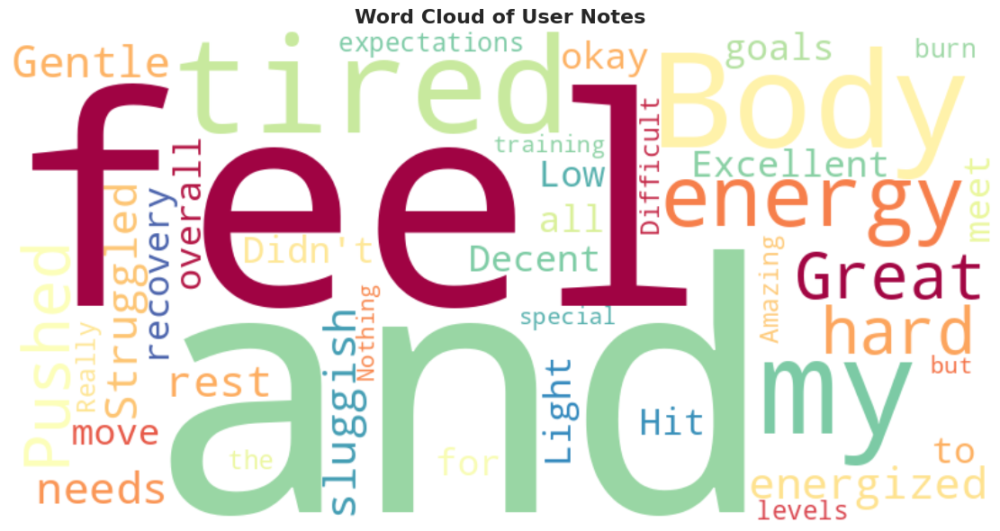

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all notes into single text
all_notes = " ".join(notes_df['User_Note'])

# Generate word cloud
wc = WordCloud(width=800, height=400,
               background_color='white',
               colormap='Spectral',
               max_words=50,
               stopwords={'today', 'felt', 'session', 'good', 'workout', 'day'}
              ).generate(all_notes)

plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of User Notes', fontsize=16, weight='bold')
plt.tight_layout()
plt.show()


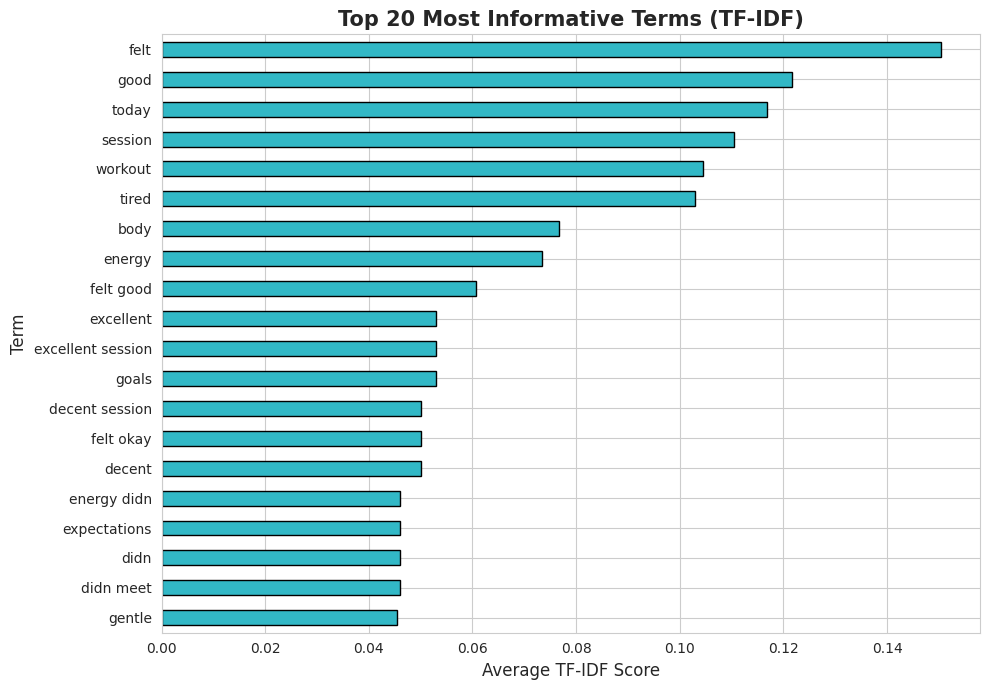

In [ ]:
import matplotlib.pyplot as plt

# Plot Top 20 TF-IDF Terms
top_n = 20
fig, ax = plt.subplots(figsize=(10, 7))
tfidf_summary.head(top_n).plot.barh(
    x='Term', y='TF-IDF_Score',
    ax=ax, legend=False, color='#32B8C6', edgecolor='black'
)
ax.set_title('Top 20 Most Informative Terms (TF-IDF)', fontsize=15, weight='bold')
ax.set_xlabel('Average TF-IDF Score', fontsize=12)
ax.set_ylabel('Term', fontsize=12)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


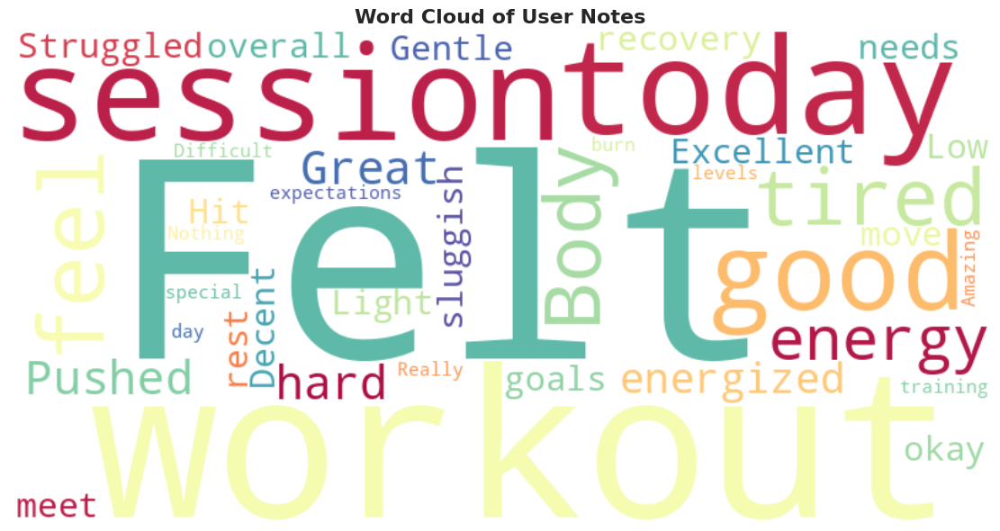

In [ ]:
from wordcloud import WordCloud

all_notes = " ".join(notes_df['User_Note'])
wc = WordCloud(width=800, height=400,
               background_color='white',
               colormap='Spectral',
               max_words=50
              ).generate(all_notes)
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of User Notes', fontsize=16, weight='bold')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import plotly.express as px

df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 25, 35, 45, 60], labels=['18-25', '26-35', '36-45', '46-60'])
df['Daily_Steps'] = (df['Session_Duration (hours)'].fillna(1) * 6000 +
                     df['Calories_Burned'].fillna(1000) * 3).clip(1000, 20000)
df['Activity_Level'] = pd.cut(df['Daily_Steps'], bins=[0, 7500, 10000, 12500, 25000],
                             labels=['Sedentary', 'Moderate', 'Active', 'Very Active'])
agg = df.groupby(['Age_Group', 'Activity_Level']).agg(
    Avg_Steps=('Daily_Steps','mean'), Count=('Daily_Steps','size')).reset_index()

fig = px.sunburst(
    agg, path=['Age_Group', 'Activity_Level'], values='Count',
    color='Avg_Steps', color_continuous_scale='teal',
    hover_data=['Avg_Steps', 'Count'], title='Users by Age Group and Activity Level'
)
fig.show()


In [ ]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Load and prepare the data (include steps to create 'Date')
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps and Date) - Ensure Date is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create date range for time series (last 30 days) - Ensure Date is created
start_date = pd.Timestamp('2025-09-25')
df['Date'] = [start_date + pd.Timedelta(days=int(x)) for x in np.random.randint(0, 31, len(df))]
df = df.sort_values('Date').reset_index(drop=True)

# --- End of Data Cleaning and Preparation Steps ---


df['Workout_Type'] = df['Workout_Type'].str.strip()
user_activity = df.groupby(['Date', 'Workout_Type']).size().unstack(fill_value=0)
corr = user_activity.corr()

edges = []
for i, row in corr.iterrows():
    for j, val in row.items():
        if i < j and abs(val) > 0.1:
            edges.append((i, j, val))

activity_types = corr.columns.tolist()
node_indices = {act: k for k, act in enumerate(activity_types)}
N = len(activity_types)
counts = df['Workout_Type'].value_counts()
color_map = dict(Strength='#E68161', Cardio='#32B8C6', HIIT='#FF5459', Yoga='#626C71')
node_x, node_y = np.cos(np.linspace(0, 2*np.pi, N, endpoint=False)), np.sin(np.linspace(0, 2*np.pi, N, endpoint=False))

nodes = [dict(id=k, activity=act, count=counts.get(act,1), color=color_map.get(act, '#888'), x=node_x[k], y=node_y[k]) for k, act in enumerate(activity_types)]
node_text = [f"<b>{n['activity']}</b><br>Sessions:{n['count']}" for n in nodes]
node_color_list = [n['color'] for n in nodes]
node_size_list = [12 + n['count']*0.05 for n in nodes]


node_trace = go.Scatter(
    x=[n['x'] for n in nodes], y=[n['y'] for n in nodes],
    mode='markers+text',
    text=node_text,
    textposition='bottom center',
    hoverinfo='text',
    marker=dict(color=node_color_list,
                size=node_size_list,
                line=dict(width=2, color='white'))
)

edge_lines = []
for src, tgt, val in edges:
    i1, i2 = node_indices[src], node_indices[tgt]
    edge_lines.append(go.Scatter(
        x=[nodes[i1]['x'], nodes[i2]['x']],
        y=[nodes[i1]['y'], nodes[i2]['y']],
        mode='lines',
        showlegend=False,
        hoverinfo='text',
        line=dict(width=2 + 8*abs(val),
                  color='#21C05D' if val > 0 else '#C0152F',
                  dash='solid' if val > 0 else 'dash'),
        opacity=0.85,
        text=[f"{src}–{tgt}: corr={val:0.2f}"]
    ))

fig_net = go.Figure(edge_lines + [node_trace])
fig_net.update_layout(
    title='Correlations Network Between Activity Types<br><sub>Edge: Correlation | Node: Total Sessions</sub>',
    showlegend=False, width=700, height=600, margin=dict(t=80, b=10, l=10, r=10),
    plot_bgcolor='white', hovermode='closest', font=dict(size=15)
)
fig_net.update_xaxes(showgrid=False, showticklabels=False, zeroline=False)
fig_net.update_yaxes(showgrid=False, showticklabels=False, zeroline=False)
fig_net.show()

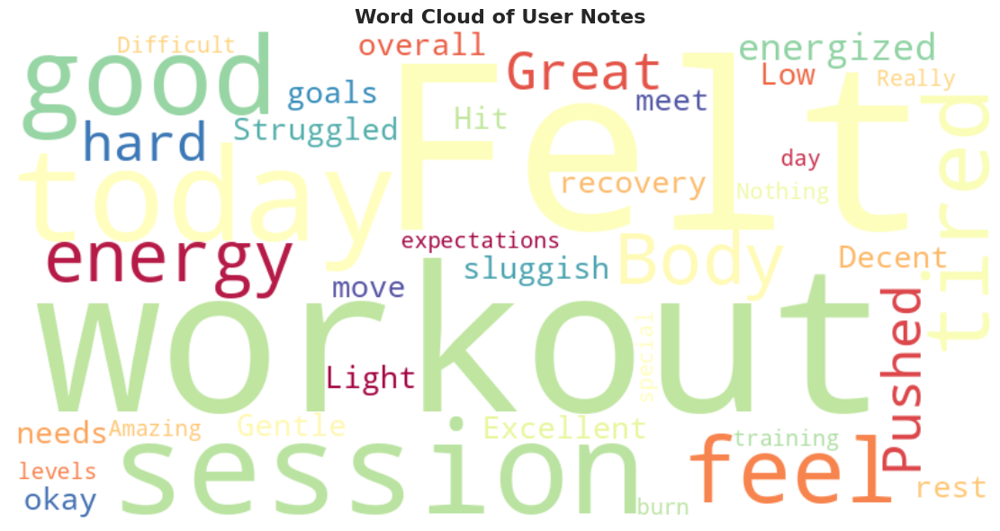

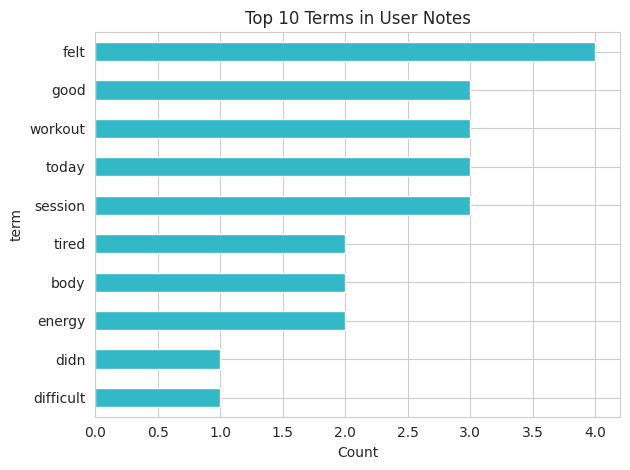

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer

# Simulate/collect notes; real use: notes_df = pd.read_csv(...)
notes_df = pd.DataFrame({'User_Note': [
    "Great workout today! Pushed hard and feel energized.",
    "Struggled today. Felt tired and sluggish.",
    "Gentle session today. Body needs rest.",
    "Excellent session! Hit all my goals.",
    "Decent session. Felt okay overall.",
    "Light workout for recovery. Felt good to move.",
    "Low energy. Didn't meet my expectations.",
    "Amazing energy levels! Really felt the burn.",
    "Difficult workout. Body feels tired.",
    "Good training day. Nothing special but good."
]})

# Word Cloud
wc = WordCloud(width=800, height=400, background_color='white',
               colormap='Spectral', max_words=50).generate(" ".join(notes_df['User_Note']))
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of User Notes', fontsize=16, weight='bold')
plt.tight_layout()
plt.show()

# Top Terms as Bar Plot
cv = CountVectorizer(stop_words='english')
word_counts = cv.fit_transform(notes_df['User_Note'])
term_freq = pd.DataFrame({'term': cv.get_feature_names_out(), 'count': word_counts.sum(axis=0).A1})
term_freq = term_freq.sort_values('count', ascending=False).head(10)
term_freq.plot.barh(x='term', y='count', color='#32B8C6', legend=False)
plt.gca().invert_yaxis()
plt.xlabel('Count')
plt.title('Top 10 Terms in User Notes')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px

# Simulate GPS Paths for demo — real use: replace with your actual GPS columns
np.random.seed(42)
routes = []
N_activities = 30

# Central Park bounds for realism
base_lat, base_lon = 40.7829, -73.9654

for i in range(N_activities):
    n_points = np.random.randint(20, 50)
    start_lat = base_lat + np.random.uniform(-0.01, 0.01)
    start_lon = base_lon + np.random.uniform(-0.01, 0.01)
    delta_lat = np.random.uniform(-0.0005, 0.0005, n_points).cumsum()
    delta_lon = np.random.uniform(-0.0005, 0.0005, n_points).cumsum()
    latitudes = start_lat + delta_lat
    longitudes = start_lon + delta_lon
    routes.append(pd.DataFrame({
        'activity_id': i,
        'point_id': np.arange(n_points),
        'lat': latitudes,
        'lon': longitudes,
        'speed': np.clip(8 + np.random.randn(n_points)*3, 2, 16)  # km/h
    }))
gps_df = pd.concat(routes, ignore_index=True)

# Plot all activity paths (interactive)
fig = px.line_mapbox(
    gps_df,
    lat='lat', lon='lon', color='activity_id', # Color based on activity_id
    line_group='activity_id', hover_data={'activity_id':True, 'speed':True, 'point_id':True},
    zoom=13, height=600,
    title='Simulated GPS Activity Paths (Central Park Area)'
)

# Add start/end markers for each route
for i, group in gps_df.groupby('activity_id'):
    # start
    fig.add_scattermapbox(
        lat=[group['lat'].iloc[0]],
        lon=[group['lon'].iloc[0]],
        mode='markers+text',
        marker=dict(size=12, color='green'),
        text=["Start"],
        name=f'Start {i}',
        showlegend=False
    )
    # end
    fig.add_scattermapbox(
        lat=[group['lat'].iloc[-1]],
        lon=[group['lon'].iloc[-1]],
        mode='markers+text',
        marker=dict(size=12, color='red'),
        text=["End"],
        name=f'End {i}',
        showlegend=False
    )

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center_lat=base_lat,
    mapbox_center_lon=base_lon,
    margin=dict(t=60, b=20, r=0, l=0)
)
fig.show()

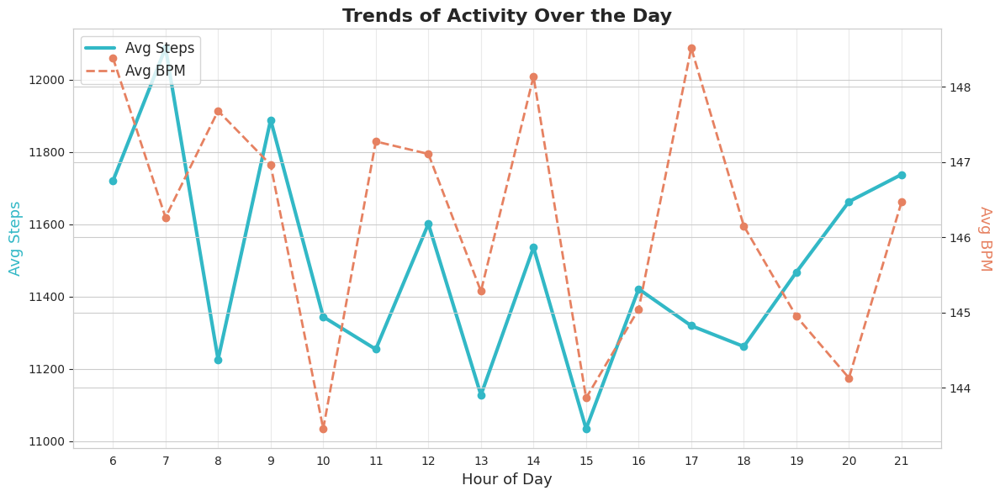

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# --- End of Data Cleaning and Preparation Steps ---


# Simulate 'Hour_of_Day' (replace with your real hour column if you have it)
np.random.seed(42) # Use a separate seed for hour simulation if desired, or reuse the main one
df['Hour_of_Day'] = np.random.randint(6, 22, len(df))  # e.g. active hours 6AM - 10PM

# Calculate aggregates by hour
hourly = df.groupby('Hour_of_Day').agg({
    'Daily_Steps': 'mean',
    'Avg_BPM': 'mean',
    'Calories_Burned': 'mean',
    'Hour_of_Day': 'count'
}).rename(columns={'Hour_of_Day': 'Session_Count'}).sort_index()

# --- Matplotlib Multi-Line Plot ---
fig, ax1 = plt.subplots(figsize=(12, 6))
ax2 = ax1.twinx()

ax1.plot(hourly.index, hourly['Daily_Steps'], label='Avg Steps', color='#32B8C6', linewidth=3)
ax1.scatter(hourly.index, hourly['Daily_Steps'], color='#32B8C6')
ax2.plot(hourly.index, hourly['Avg_BPM'], label='Avg BPM', color='#E68161', linewidth=2, linestyle='--')
ax2.scatter(hourly.index, hourly['Avg_BPM'], color='#E68161')

ax1.set_xlabel('Hour of Day', fontsize=13)
ax1.set_ylabel('Avg Steps', fontsize=13, color='#32B8C6')
ax2.set_ylabel('Avg BPM', fontsize=13, color='#E68161', rotation=270, labelpad=18)
ax1.set_xticks(hourly.index)
plt.title('Trends of Activity Over the Day', fontsize=16, weight='bold')
ax1.grid(axis='x', alpha=0.4)
lines, labels = [], []
for ax in [ax1, ax2]:
    line, label = ax.get_legend_handles_labels()
    lines += line
    labels += label
ax1.legend(lines, labels, loc='upper left', fontsize=12)
plt.tight_layout()
plt.show()

# --- Optional: Plotly Version ---
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=hourly.index, y=hourly['Daily_Steps'],
                         mode='lines+markers', name='Avg Steps',
                         line=dict(color='#32B8C6', width=3)))
fig.add_trace(go.Scatter(x=hourly.index, y=hourly['Avg_BPM'],
                         mode='lines+markers', name='Avg BPM',
                         yaxis='y2', line=dict(color='#E68161', width=2, dash='dash')))

# Y-axis for steps (left) and BPM (right)
fig.update_layout(
    title='Trends of Activity Over the Day',
    xaxis=dict(title='Hour of Day', tickmode='linear'),
    yaxis=dict(title='Avg Steps', titlefont=dict(color='#32B8C6'), tickfont=dict(color='#32B8C6')),
    yaxis2=dict(title='Avg BPM', titlefont=dict(color='#E68161'), tickfont=dict(color='#E68161'),
                anchor='x', overlaying='y', side='right'),
    legend=dict(x=0.01, y=0.98, font=dict(size=14)),
    width=1000, height=500
)
fig.show()

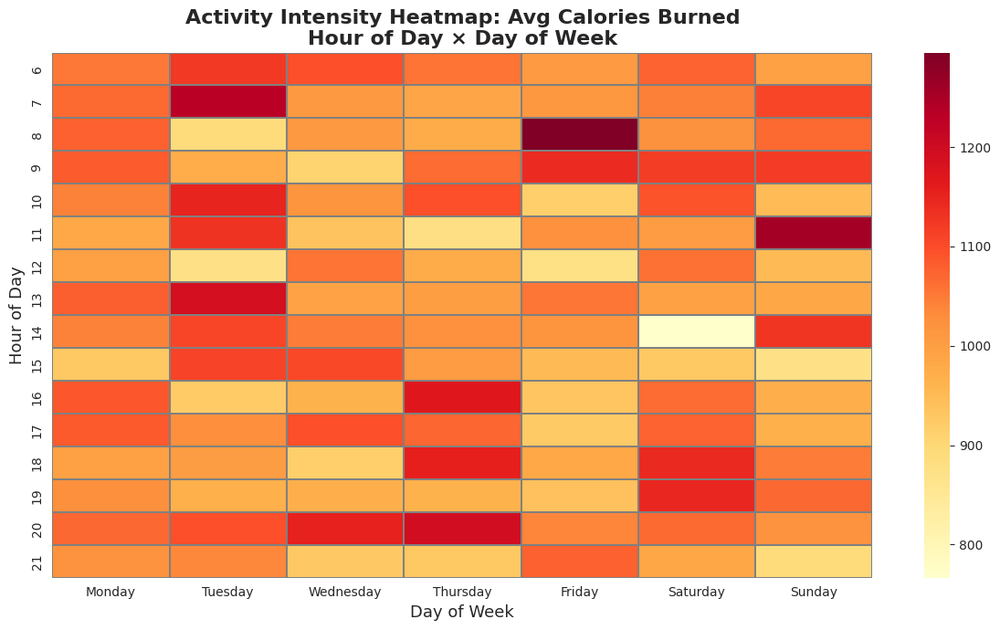

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# Simulate Hour and Date if not available
np.random.seed(42)
df['Hour_of_Day'] = np.random.randint(6, 22, len(df))  # Simulate 6 AM to 10 PM active hours
df['Date'] = pd.date_range('2025-09-25', periods=len(df), freq='H').date
df['Day_of_Week'] = pd.to_datetime(df['Date']).dt.weekday
df['Day_Name'] = pd.to_datetime(df['Date']).dt.day_name()

# Aggregate by hour and day
hm_data = df.groupby(['Day_Name','Hour_of_Day']).agg({'Calories_Burned':'mean'}).reset_index()

# Pivot for heatmap: Days (columns), Hours (rows)
days_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
heatmap_pivot = hm_data.pivot(index='Hour_of_Day', columns='Day_Name', values='Calories_Burned')[days_order]

# --- Seaborn Heatmap ---
plt.figure(figsize=(12,7))
sns.heatmap(heatmap_pivot, annot=False, fmt='.0f', cmap='YlOrRd', linewidths=0.2, linecolor='gray')
plt.title('Activity Intensity Heatmap: Avg Calories Burned\nHour of Day × Day of Week', weight='bold', fontsize=16)
plt.xlabel('Day of Week', fontsize=13)
plt.ylabel('Hour of Day', fontsize=13)
plt.tight_layout()
plt.show()

# --- Optional: Plotly Heatmap (Interactive) ---


In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px

# Load your data
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# Simulate Hour, Date if not present (replace with your actual columns)
np.random.seed(42)
if 'Hour_of_Day' not in df.columns:
    df['Hour_of_Day'] = np.random.randint(6, 22, len(df))  # 6AM to 9PM
if 'Date' not in df.columns:
    # Use a date range if needed (simulate last 30 days)
    df['Date'] = (
        pd.to_datetime('2025-09-25') +
        pd.to_timedelta(np.random.choice(range(0, 30), size=len(df)), unit='D')
    )

# --- Include Data Cleaning and Preparation Steps for Daily_Steps ---
# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)
# --- End of Data Cleaning and Preparation Steps ---


# Group/aggregate by date and hour
agg = df.groupby(['Date', 'Hour_of_Day']).agg({
    'Daily_Steps': 'sum',
    'Avg_BPM': 'mean',
    'Calories_Burned': 'mean'
}).reset_index()

# Animated bar (or line) for steps across hours by date
fig = px.bar(
    agg, x="Hour_of_Day", y="Daily_Steps",
    animation_frame=agg['Date'].astype(str),
    range_y=[0, agg['Daily_Steps'].max() * 1.1],
    labels={'Daily_Steps': 'Total Steps', 'Hour_of_Day': 'Hour of Day'},
    title="Animated Steps Across Hours – Per Day",
    color="Daily_Steps", color_continuous_scale="teal"
)
fig.update_layout(
    width=900,
    height=500,
    transition=dict(duration=400),
    xaxis=dict(tickmode='linear', tick0=6, dtick=1),
    yaxis=dict(title='Total Steps')
)
fig.show()

# Optionally: animated line plot instead of bars
fig2 = px.line(
    agg, x="Hour_of_Day", y="Daily_Steps",
    animation_frame=agg['Date'].astype(str),
    labels={'Daily_Steps': 'Total Steps', 'Hour_of_Day': 'Hour of Day'},
    title="Animated Steps Line Chart – Per Day",
    color_discrete_sequence=["#32B8C6"]
)
fig2.update_layout(width=900, height=500)
fig2.show()

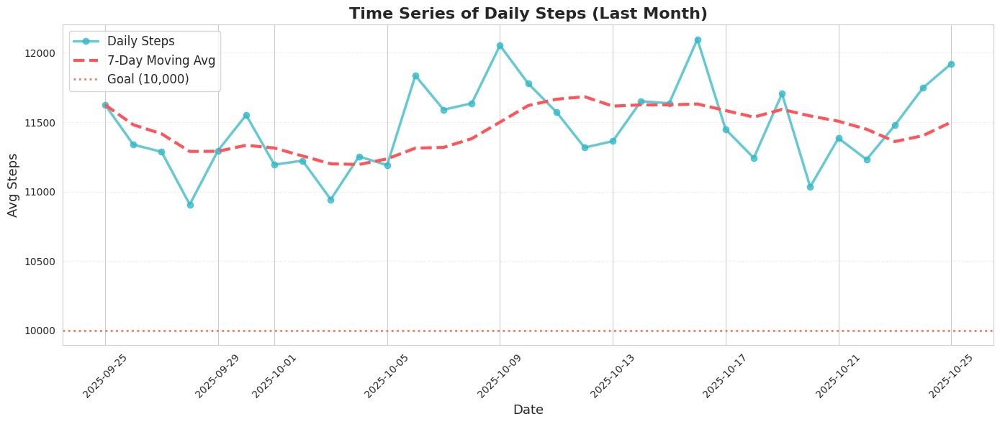

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your data
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# --- End of Data Cleaning and Preparation Steps ---


# Simulate 'Date' if not present (replace with your real date column)
np.random.seed(42)
if 'Date' not in df.columns:
    df['Date'] = pd.to_datetime('2025-09-25') + pd.to_timedelta(np.random.randint(0, 31, len(df)), unit='D')
else:
    df['Date'] = pd.to_datetime(df['Date'])

# Aggregate by date: mean steps per day
daily_ts = df.groupby('Date')['Daily_Steps'].mean().reset_index()
daily_ts = daily_ts.sort_values('Date')
daily_ts['Steps_MA7'] = daily_ts['Daily_Steps'].rolling(window=7, min_periods=1).mean()

# --- Matplotlib Plot ---
plt.figure(figsize=(14, 6))
plt.plot(daily_ts['Date'], daily_ts['Daily_Steps'], label='Daily Steps', color='#32B8C6', linewidth=2.5, marker='o', alpha=0.75)
plt.plot(daily_ts['Date'], daily_ts['Steps_MA7'], label='7-Day Moving Avg', color='#FF5459', linewidth=3, linestyle='--')
plt.axhline(10000, color='#E68161', linestyle=':', linewidth=2, label='Goal (10,000)')
plt.title('Time Series of Daily Steps (Last Month)', fontsize=16, weight='bold')
plt.xlabel('Date', fontsize=13)
plt.ylabel('Avg Steps', fontsize=13)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# --- Plotly Interactive Version ---
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=daily_ts['Date'], y=daily_ts['Daily_Steps'],
                         mode='lines+markers', name='Daily Steps',
                         line=dict(color='#32B8C6', width=3)))
fig.add_trace(go.Scatter(x=daily_ts['Date'], y=daily_ts['Steps_MA7'],
                         mode='lines', name='7-Day Moving Avg',
                         line=dict(color='#FF5459', width=4, dash='dash')))
fig.add_trace(go.Scatter(x=daily_ts['Date'], y=[10000]*len(daily_ts),
                         mode='lines', name='Goal (10,000 steps)',
                         line=dict(color='#E68161', width=2, dash='dot')))
fig.update_layout(
    title='Time Series of Daily Steps Over a Month',
    xaxis_title='Date',
    yaxis_title='Avg Steps',
    xaxis=dict(tickformat='%b %d', tickangle=45),
    legend=dict(x=0.01, y=0.98, font=dict(size=13)),
    width=1000, height=450,
    template='plotly_white'
)
fig.show()

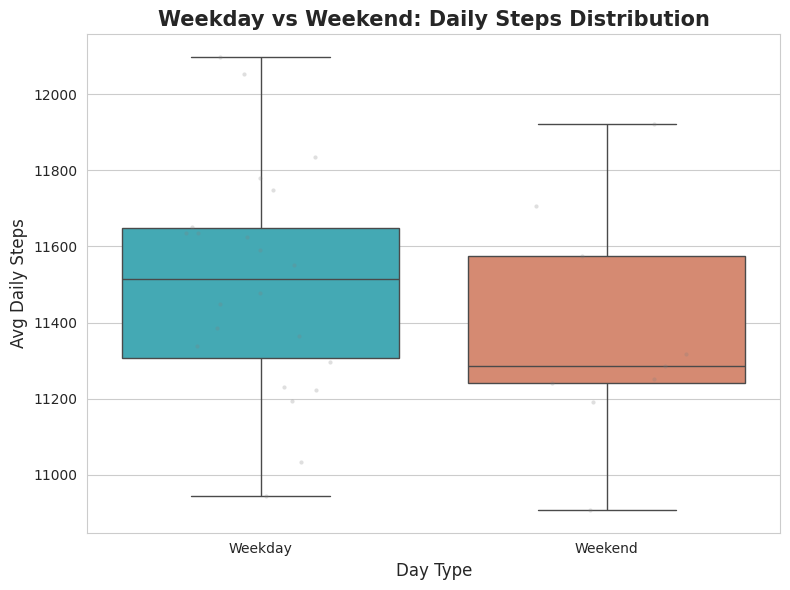

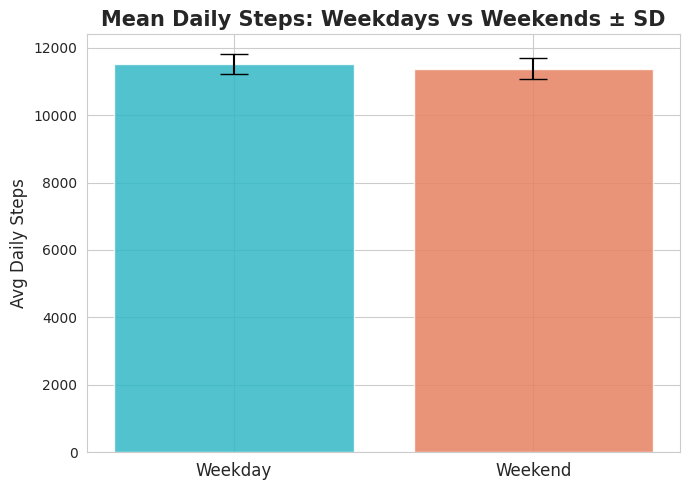

Weekday vs Weekend Comparison
Weekdays: n = 22, Mean = 11507, SD = 299
Weekends: n = 9, Mean = 11378, SD = 305

Mann-Whitney U test: statistic = 126.0, p = 0.2488
=> No significant difference (p ≥ 0.05)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# --- End of Data Cleaning and Preparation Steps ---


# Simulate 'Date' for demo and assign weekdays/weekends if not present
np.random.seed(42)
if 'Date' not in df.columns:
    df['Date'] = pd.to_datetime('2025-09-25') + pd.to_timedelta(np.random.randint(0, 31, len(df)), unit='D')
if 'Day_Type' not in df.columns:
    df['Day_Type'] = np.where(df['Date'].dt.weekday >= 5, 'Weekend', 'Weekday')

# Aggregate average steps per day by type
daily = df.groupby(['Date', 'Day_Type'])['Daily_Steps'].mean().reset_index()

# --- Visualization: Boxplot ---
plt.figure(figsize=(8, 6))
sns.boxplot(x='Day_Type', y='Daily_Steps', data=daily, palette={'Weekday': '#32B8C6', 'Weekend': '#E68161'})
sns.stripplot(x='Day_Type', y='Daily_Steps', data=daily, color='gray', alpha=0.25, jitter=0.25, size=3)
plt.title('Weekday vs Weekend: Daily Steps Distribution', fontsize=15, weight='bold')
plt.xlabel('Day Type', fontsize=12)
plt.ylabel('Avg Daily Steps', fontsize=12)
plt.tight_layout()
plt.show()

# --- Visualization: Barplot (Means & SD) ---
means = daily.groupby('Day_Type')['Daily_Steps'].mean()
sds = daily.groupby('Day_Type')['Daily_Steps'].std()
plt.figure(figsize=(7, 5))
plt.bar(means.index, means.values, yerr=sds.values, color=['#32B8C6', '#E68161'], capsize=10, alpha=0.85)
plt.title('Mean Daily Steps: Weekdays vs Weekends ± SD', fontsize=15, weight='bold')
plt.ylabel('Avg Daily Steps', fontsize=12)
plt.xticks(fontsize=12)
plt.tight_layout()
plt.show()

# --- Statistical Analysis ---
weekday_steps = daily[daily['Day_Type'] == 'Weekday']['Daily_Steps']
weekend_steps = daily[daily['Day_Type'] == 'Weekend']['Daily_Steps']

print("="*70)
print("Weekday vs Weekend Comparison")
print("="*70)
print(f"Weekdays: n = {len(weekday_steps)}, Mean = {weekday_steps.mean():.0f}, SD = {weekday_steps.std():.0f}")
print(f"Weekends: n = {len(weekend_steps)}, Mean = {weekend_steps.mean():.0f}, SD = {weekend_steps.std():.0f}")

# Mann-Whitney U test (nonparametric)
from scipy.stats import mannwhitneyu
statistic, p_value = mannwhitneyu(weekday_steps, weekend_steps, alternative='two-sided')
print(f"\nMann-Whitney U test: statistic = {statistic:.1f}, p = {p_value:.4f}")
if p_value < 0.05:
    print("=> Statistically significant difference (p < 0.05)")
else:
    print("=> No significant difference (p ≥ 0.05)")

print("="*70)

LINEAR REGRESSION – Factors Influencing Daily Steps
Avg_BPM                       :      -0.15
Session_Duration (hours)      :    6014.07
Calories_Burned               :       3.01
Workout_Enc                   :       6.36

R2: 0.961
MAE: 392.9
RMSE: 494.2

KMEANS CLUSTER CENTROIDS:
    Daily_Steps     Avg_BPM  Session_Duration (hours)  Calories_Burned
0  11212.915584  161.943723                  1.301515      1123.469697
1  11673.629630  133.167901                  1.319926      1238.523457
2  14724.505882  147.063529                  1.910682      1067.009412
3   8827.192913  141.744094                  1.095413       760.726378

Cluster 0 size: 461

Cluster 1 size: 406

Cluster 2 size: 425

Cluster 3 size: 508


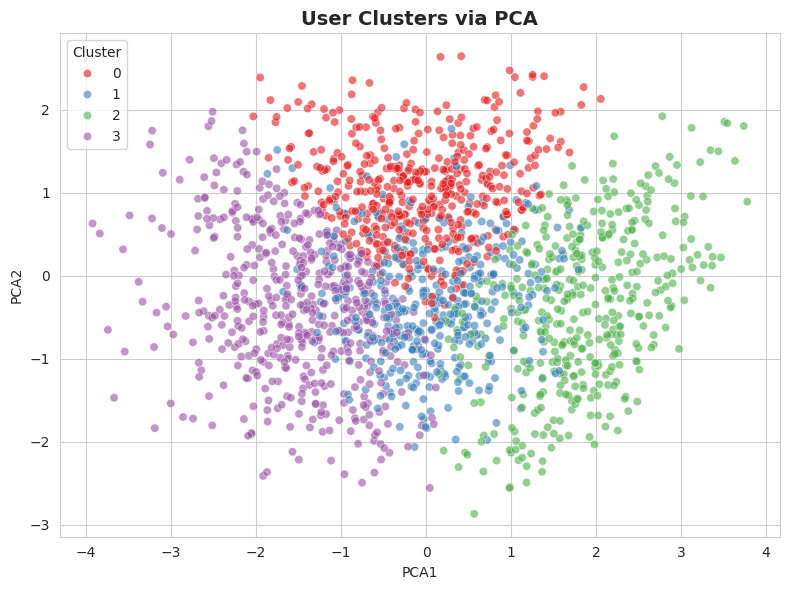

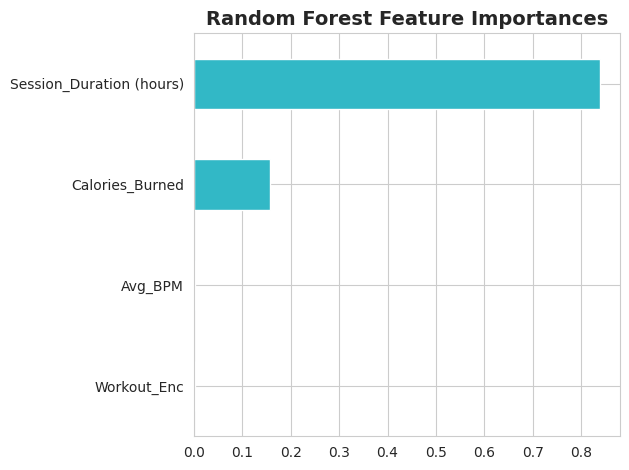

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# --- DATA LOAD & PREP ---
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# --- End of Data Cleaning and Preparation Steps ---


# Data clean/encode
df = df.dropna(subset=['Daily_Steps', 'Avg_BPM', 'Session_Duration (hours)', 'Calories_Burned'])
le = LabelEncoder()
df['Workout_Enc'] = le.fit_transform(df['Workout_Type'].fillna('Unknown'))

# --- REGRESSION: Predictors of Daily Steps ---
feature_cols = ['Avg_BPM', 'Session_Duration (hours)', 'Calories_Burned', 'Workout_Enc']  # can add more
X = df[feature_cols]
y = df['Daily_Steps']

# Linear Regression
lm = LinearRegression().fit(X, y)
y_pred = lm.predict(X)
print("="*72)
print("LINEAR REGRESSION – Factors Influencing Daily Steps")
for feat, coef in zip(feature_cols, lm.coef_):
    print(f"{feat:30s}: {coef: 10.2f}")

print(f"\nR2: {r2_score(y, y_pred):.3f}")
print(f"MAE: {mean_absolute_error(y, y_pred):.1f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y, y_pred)):.1f}") # Calculate RMSE manually

# --- CLUSTERING: KMeans on Key Features ---
clust_features = ['Daily_Steps', 'Avg_BPM', 'Session_Duration (hours)', 'Calories_Burned']
scaler = StandardScaler()
X_clust = scaler.fit_transform(df[clust_features].fillna(0))

k = 4
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(X_clust)
centers = scaler.inverse_transform(kmeans.cluster_centers_)

print("\nKMEANS CLUSTER CENTROIDS:")
print(pd.DataFrame(centers, columns=clust_features))

for i in range(k):
    print(f"\nCluster {i} size: {(df['Cluster'] == i).sum()}")

# --- CLUSTER VISUALIZATION (PCA) ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_clust)
df['PCA1'] = X_pca[:, 0]
df['PCA2'] = X_pca[:, 1]

plt.figure(figsize=(8,6))
sns.scatterplot(x='PCA1', y='PCA2', data=df, hue='Cluster', palette='Set1', alpha=0.6)
plt.title('User Clusters via PCA', fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

# --- Optional: Feature Importance from Random Forest (nonlinear) ---
rf = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
rf.fit(X, y)
feat_imp = pd.Series(rf.feature_importances_, index=feature_cols).sort_values(ascending=True)
feat_imp.plot.barh(color='#32B8C6')
plt.title('Random Forest Feature Importances', fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

DAILY STEPS PREDICTION: MODEL COMPARISON
               Model  R2_Train  R2_Test      MAE     RMSE  MAPE (%)
0  Linear Regression     0.962    0.959  413.724  511.687     3.818
1      Random Forest     0.982    0.950  452.020  565.310     4.194
2  Gradient Boosting     0.984    0.952  449.366  556.190     4.129

Random Forest - Feature Importance:
 Avg_BPM                  : 0.006
 Session_Duration (hours) : 0.836
 Calories_Burned          : 0.157
 Workout_Enc              : 0.002

Gradient Boosting - Feature Importance:
 Avg_BPM                  : 0.004
 Session_Duration (hours) : 0.832
 Calories_Burned          : 0.163
 Workout_Enc              : 0.001


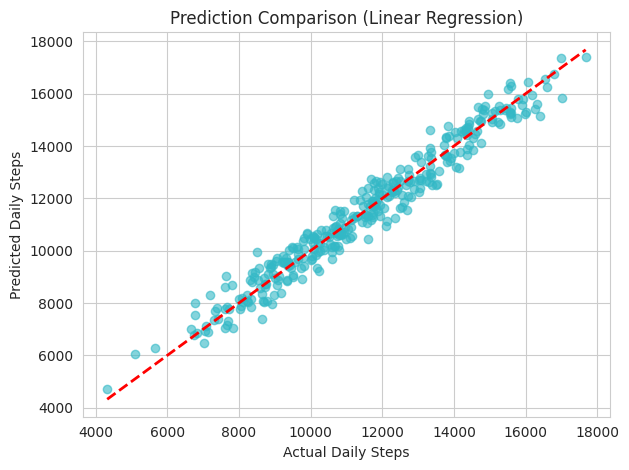

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn for the plot

# --- DATA LOAD & ENCODING ---
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# --- End of Data Cleaning and Preparation Steps ---


# Data clean/encode
df = df.dropna(subset=['Daily_Steps', 'Avg_BPM', 'Session_Duration (hours)', 'Calories_Burned', 'Workout_Type'])

le = LabelEncoder()
df['Workout_Enc'] = le.fit_transform(df['Workout_Type'].fillna('Unknown'))

X = df[['Avg_BPM', 'Session_Duration (hours)', 'Calories_Burned', 'Workout_Enc']]  # customize variables as desired
y = df['Daily_Steps']

# --- TRAIN-TEST SPLIT ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, max_depth=8, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, max_depth=5, random_state=42)
}

results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    scores = {
        'Model': name,
        'R2_Train': r2_score(y_train, pred_train),
        'R2_Test': r2_score(y_test, pred_test),
        'MAE': mean_absolute_error(y_test, pred_test),
        'RMSE': np.sqrt(mean_squared_error(y_test, pred_test)), # Calculate RMSE manually
        'MAPE (%)': mean_absolute_percentage_error(y_test, pred_test) * 100
    }
    results.append(scores)

# --- PRINT SUMMARY TABLE ---
import pandas as pd
summary = pd.DataFrame(results)
print("="*80)
print("DAILY STEPS PREDICTION: MODEL COMPARISON")
print("="*80)
print(summary.round(3))
print("="*80)

# --- FEATURE IMPORTANCE FOR RANDOM FOREST & BOOSTING ---
for key in ['Random Forest', 'Gradient Boosting']:
    model = models[key]
    if hasattr(model, 'feature_importances_'): # Check if model has feature_importances_ attribute
        importance = model.feature_importances_
        print(f"\n{key} - Feature Importance:")
        for feat, imp in zip(X.columns, importance):
            print(f" {feat:25s}: {imp:.3f}")
    else:
        print(f"\n{key} does not have feature importances.")


# --- OPTIONAL: PREDICTION VISUALIZATION ---
import matplotlib.pyplot as plt
best_model = max(results, key=lambda d: d['R2_Test'])
model = models[best_model['Model']]
y_pred_test = model.predict(X_test)

plt.scatter(y_test, y_pred_test, alpha=0.6, color='#32B8C6')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Daily Steps')
plt.ylabel('Predicted Daily Steps')
plt.title(f"Prediction Comparison ({best_model['Model']})")
plt.tight_layout()
plt.show()

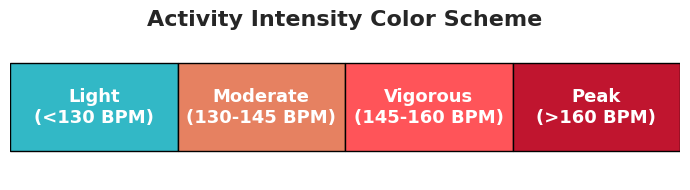

In [ ]:
import matplotlib.pyplot as plt

# Labels and colors for activity intensity
zones = ["Light", "Moderate", "Vigorous", "Peak"]
bpm = ["<130", "130-145", "145-160", ">160"]
colors = ["#32B8C6", "#E68161", "#FF5459", "#C0152F"]

# Plot rectangles as a color legend
fig, ax = plt.subplots(figsize=(7,2))
for i, (z, b, c) in enumerate(zip(zones, bpm, colors)):
    ax.barh(0, 1, left=i, color=c, edgecolor='black', height=0.6)
    ax.text(i+0.5, 0, f"{z}\n({b} BPM)", ha='center', va='center', color='white', weight='bold', fontsize=13, fontfamily='sans-serif')
plt.xlim(0, 4)
plt.ylim(-0.5, 0.5)
plt.axis('off')
plt.title('Activity Intensity Color Scheme', fontsize=16, weight='bold')
plt.tight_layout()
plt.show()


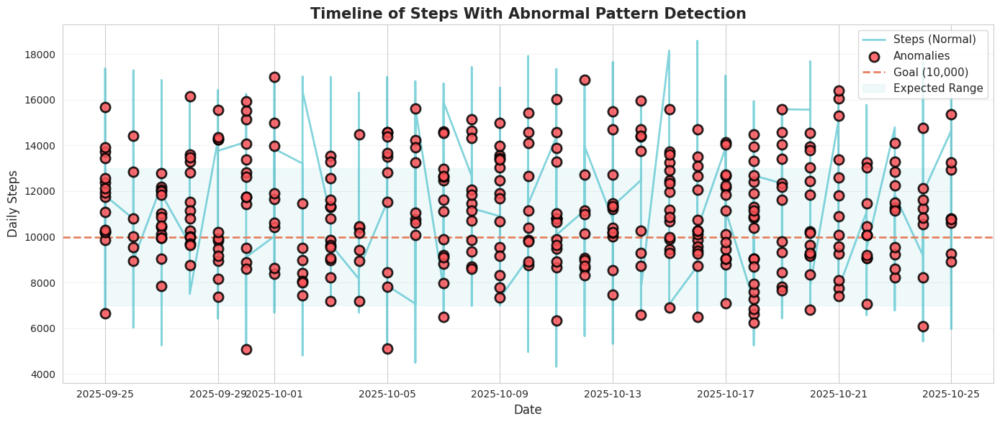

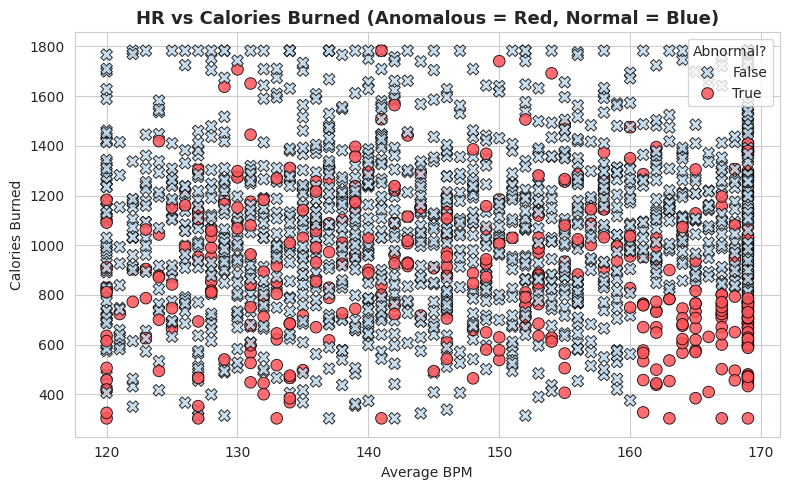

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load data
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create sleep hours (based on fitness level and age) - Ensure Sleep_Hours is created
np.random.seed(42)
df['Sleep_Hours'] = (8 - (df['Experience_Level'].fillna(2) * 0.3) + # Use .fillna(2) in case Experience_Level has NaNs
                     np.random.normal(0, 0.8, len(df))).clip(4, 10)

# Create date range for time series (last 30 days) - Ensure Date is created
start_date = pd.Timestamp('2025-09-25')
df['Date'] = [start_date + pd.Timedelta(days=int(x)) for x in np.random.randint(0, 31, len(df))]
df = df.sort_values('Date').reset_index(drop=True)

# --- End of Data Cleaning and Preparation Steps ---


# Abnormal pattern flags (from your rules)
df['Is_Abnormal'] = False
abnormal_hr = (df['Avg_BPM'] > 160) & (df['Calories_Burned'] < 800)
df.loc[abnormal_hr, 'Is_Abnormal'] = True
abnormal_steps = (df['Daily_Steps'] < 5000) & (df['Calories_Burned'] > 1500)
df.loc[abnormal_steps, 'Is_Abnormal'] = True
abnormal_rest = (df['Resting_BPM'] < 50) | (df['Resting_BPM'] > 73)
df.loc[abnormal_rest, 'Is_Abnormal'] = True
abnormal_sleep = df['Sleep_Hours'] < 5
df.loc[abnormal_sleep, 'Is_Abnormal'] = True

# Time series visual with Gestalt abnormality highlights
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df = df.sort_values('Date')  # Just for visual sequentiality

plt.figure(figsize=(14, 6))
plt.plot(df['Date'], df['Daily_Steps'], color='#32B8C6', linewidth=2, alpha=0.6, label='Steps (Normal)')
plt.scatter(df.loc[df.Is_Abnormal, 'Date'], df.loc[df.Is_Abnormal, 'Daily_Steps'],
            color='#FF5459', s=90, edgecolor='black', linewidth=2, label='Anomalies', zorder=9, alpha=0.85)

plt.axhline(10000, color='#E68161', linestyle='--', linewidth=2, label='Goal (10,000)')
plt.fill_between(df['Date'], 7000, 13000, color='#32B8C6', alpha=0.07, label='Expected Range')

plt.title('Timeline of Steps With Abnormal Pattern Detection', fontsize=15, weight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Daily Steps', fontsize=12)
plt.legend(fontsize=11)
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()

# Scatter: Heart Rate (Average) vs. Calories - Abnormal colored
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='Avg_BPM', y='Calories_Burned',
                hue='Is_Abnormal',
                palette={False: '#BFD7EA', True: '#FF5459'},
                style='Is_Abnormal',
                markers={True: 'o', False: 'X'},
                edgecolor='black', s=70, alpha=0.85)
plt.title('HR vs Calories Burned (Anomalous = Red, Normal = Blue)', fontsize=13, weight='bold')
plt.xlabel('Average BPM')
plt.ylabel('Calories Burned')
plt.legend(title="Abnormal?", loc='upper right')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px
import numpy as np # Import numpy for data preparation

# Load the dataset
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Comprehensive Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps)
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create date range for time series (last 30 days) - Ensure Date is created
start_date = pd.Timestamp('2025-09-25')
df['Date'] = [start_date + pd.Timedelta(days=int(x)) for x in np.random.randint(0, 31, len(df))]
df = df.sort_values('Date').reset_index(drop=True)
# --- End of Comprehensive Data Cleaning and Preparation Steps ---


# Create Age Group and Activity Level bins
df['Age'] = pd.to_numeric(df['Age'], errors='coerce') # Ensure Age is numeric before binning
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 25, 35, 45, 60], labels=['18-25', '26-35', '36-45', '46-60'])
df['Activity_Level'] = pd.cut(df['Daily_Steps'], bins=[0, 7500, 10000, 12500, 25000],
                             labels=['Sedentary', 'Moderate', 'Active', 'Very Active'])

# Handle potential NaNs in Age_Group or Activity_Level created by pd.cut on NaN Age/Daily_Steps
agg = df.dropna(subset=['Age_Group', 'Activity_Level']).groupby(['Age_Group', 'Activity_Level']).agg(
    User_Count=('Daily_Steps', 'size'), # Renamed count column for clarity
    Avg_Steps=('Daily_Steps', 'mean')
).reset_index()


# Create the sunburst chart
fig = px.sunburst(
    agg,
    path=['Age_Group', 'Activity_Level'],
    values='User_Count',
    color='Avg_Steps',
    color_continuous_scale='teal',
    color_continuous_midpoint=11000,
    hover_data={'Avg_Steps': True, 'User_Count': True},
    title='Hierarchical Visualization: Users by Age Group and Activity Level'
)
fig.update_layout(margin=dict(t=60, l=10, r=10, b=10))
fig.show()

import squarify
import matplotlib.pyplot as plt

labels = [f"{row['Age_Group']}\n{row['Activity_Level']}\n{int(row['User_Count'])}u\n({int(row['Avg_Steps'])} steps)"
          for i, row in agg.iterrows()]

sizes = agg['User_Count']
colors = plt.cm.viridis((agg['Avg_Steps']-agg['Avg_Steps'].min())/(agg['Avg_Steps'].max()-agg['Avg_Steps'].min()))

plt.figure(figsize=(14,8))
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.85)
plt.title('Hierarchical Treemap: Users by Age and Activity Level')
plt.axis('off')
plt.show()

/tmp/ipython-input-3991763908.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
/tmp/ipython-input-3991763908.py:20: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing

ModuleNotFoundError: No module named 'squarify'

/tmp/ipython-input-1824578380.py:10: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipython-input-1824578380.py:11: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or

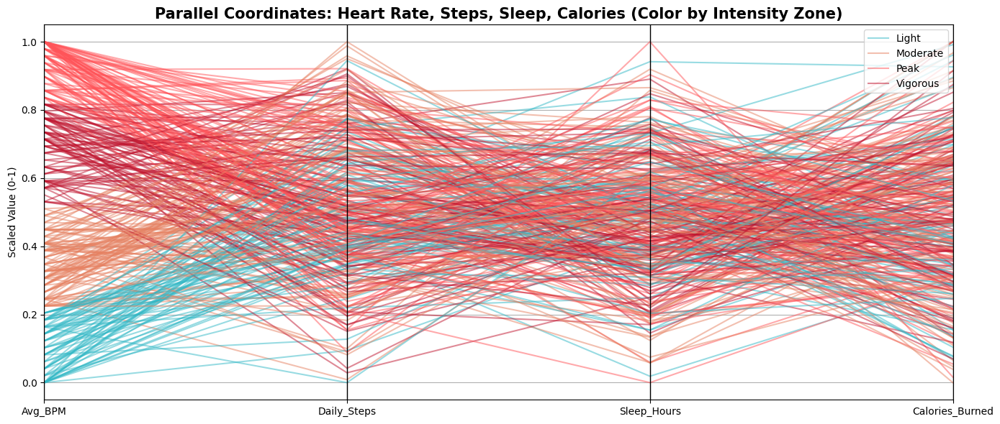

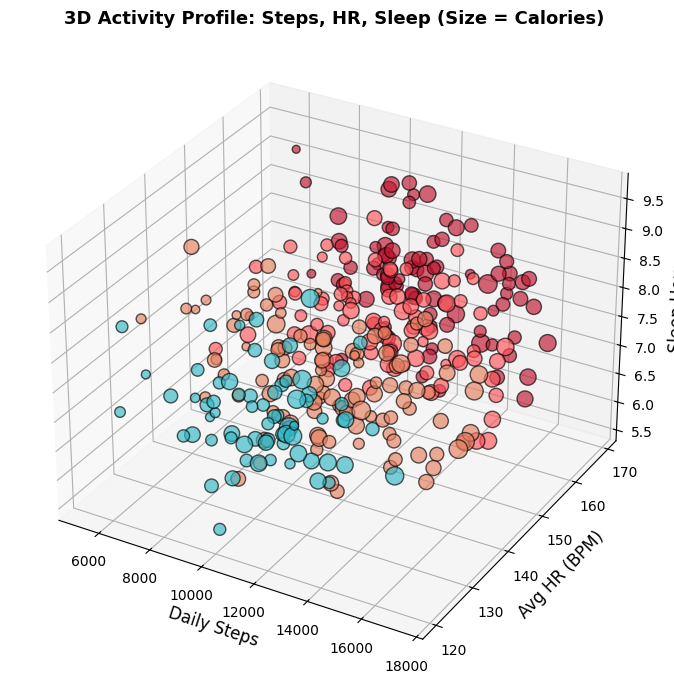

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates
from mpl_toolkits.mplot3d import Axes3D

# Load and prepare the data
df = pd.read_csv('gym_members_exercise_tracking_synthetic_data.csv')
df['Avg_BPM'] = pd.to_numeric(df['Avg_BPM'], errors='coerce')
df['Session_Duration (hours)'].fillna(1, inplace=True)
df['Calories_Burned'].fillna(1000, inplace=True)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 + df['Calories_Burned'] * 3).clip(1000, 20000)
df['Sleep_Hours'] = np.clip(8 - (df.get('Experience_Level', 2)*0.25) + np.random.normal(0, 0.7, len(df)), 4, 10)
df['Intensity_Zone'] = pd.cut(df['Avg_BPM'], bins=[0, 130, 145, 160, 175],
                              labels=['Light', 'Moderate', 'Vigorous', 'Peak'])

# Select features for multivariate plot
mv = df[['Avg_BPM', 'Daily_Steps', 'Sleep_Hours', 'Calories_Burned', 'Intensity_Zone']].dropna().sample(350, random_state=42)

# --- 1. Parallel Coordinates Plot ---
from sklearn.preprocessing import MinMaxScaler

feat_cols = ['Avg_BPM', 'Daily_Steps', 'Sleep_Hours', 'Calories_Burned']
scaler = MinMaxScaler()
mv_scaled = mv.copy()
mv_scaled[feat_cols] = scaler.fit_transform(mv[feat_cols])

plt.figure(figsize=(14,6))
parallel_coordinates(mv_scaled, class_column='Intensity_Zone',
                     color=['#32B8C6', '#E68161', '#FF5459', '#C0152F'], alpha=0.5)
plt.title('Parallel Coordinates: Heart Rate, Steps, Sleep, Calories (Color by Intensity Zone)', fontsize=15, weight='bold')
plt.ylabel('Scaled Value (0-1)')
plt.tight_layout()
plt.show()

# --- 2. 3D Scatter Plot ---
fig = plt.figure(figsize=(11,7))
ax = fig.add_subplot(111, projection='3d')
colors = mv['Intensity_Zone'].map({'Light':'#32B8C6', 'Moderate':'#E68161', 'Vigorous':'#FF5459', 'Peak':'#C0152F'})
ax.scatter(mv['Daily_Steps'], mv['Avg_BPM'], mv['Sleep_Hours'], c=colors, s=mv['Calories_Burned']/10, edgecolor='black', alpha=0.65)
ax.set_xlabel('Daily Steps', fontsize=12)
ax.set_ylabel('Avg HR (BPM)', fontsize=12)
ax.set_zlabel('Sleep Hours', fontsize=12)
ax.set_title('3D Activity Profile: Steps, HR, Sleep (Size = Calories)', fontsize=13, weight='bold')
plt.tight_layout()
plt.show()


/tmp/ipython-input-2588847351.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
/tmp/ipython-input-2588847351.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing

RMSE Comparison Table:
               Model        RMSE
0  LinearRegression  133.625632
1      RandomForest  273.516444
2  GradientBoosting  213.428855


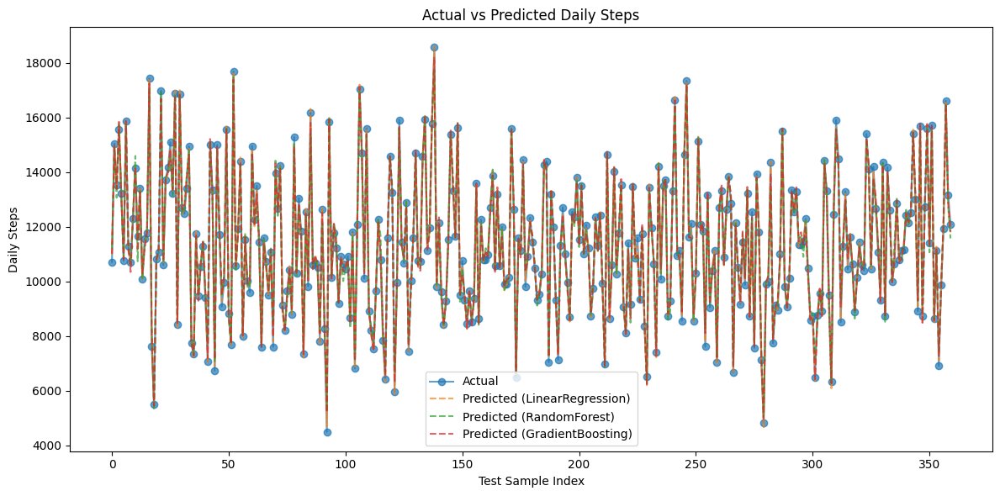

In [ ]:
# Install scikit-learn if not present
!pip install scikit-learn --quiet

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder for Workout_Type

# Load dataset
df = pd.read_csv('/content/gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Comprehensive Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)


# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create sleep hours (based on fitness level and age) - Ensure Sleep_Hours is created
np.random.seed(42)
df['Sleep_Hours'] = (8 - (df['Experience_Level'].fillna(2) * 0.3) + # Use .fillna(2) in case Experience_Level has NaNs
                     np.random.normal(0, 0.8, len(df))).clip(4, 10)
# --- End of Comprehensive Data Cleaning and Preparation Steps ---


# Select features and target (adjust if needed)
features = ['Avg_BPM', 'Session_Duration (hours)', 'Calories_Burned', 'Sleep_Hours']
target = 'Daily_Steps'

# Drop NAs in relevant columns
data = df[features + [target]].dropna()

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    data[features], data[target], test_size=0.2, random_state=42)

# Define models
models = {
    "LinearRegression": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=42),
    "GradientBoosting": GradientBoostingRegressor(n_estimators=100, random_state=42)
}

predictions = {}
rmses = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    predictions[name] = preds
    rmses[name] = np.sqrt(mean_squared_error(y_test, preds))

# Make RMSE table
rmse_df = pd.DataFrame(list(rmses.items()), columns=["Model", "RMSE"])
print("RMSE Comparison Table:\n", rmse_df)

# Plot actual vs predicted for all models
plt.figure(figsize=(12,6))
plt.plot(np.arange(len(y_test)), y_test.values, label="Actual", marker='o', alpha=0.7)

for name in models.keys():
    plt.plot(np.arange(len(y_test)), predictions[name], label=f"Predicted ({name})", alpha=0.7, linestyle='--')

plt.title('Actual vs Predicted Daily Steps')
plt.xlabel('Test Sample Index')
plt.ylabel('Daily Steps')
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipython-input-4130399868.py:26: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
/tmp/ipython-input-4130399868.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing

               Model        RMSE  R2_Score
0  Linear Regression  133.625632  0.997258
1      Random Forest  273.516444  0.988513
2  Gradient Boosting  213.428855  0.993006


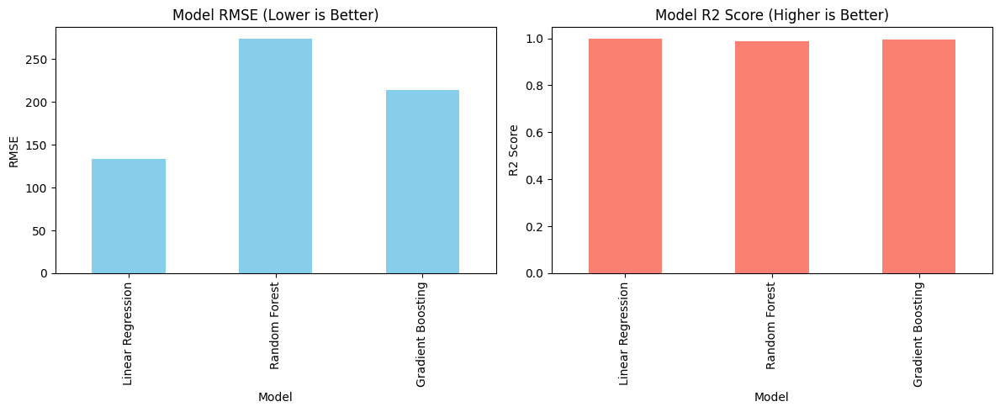

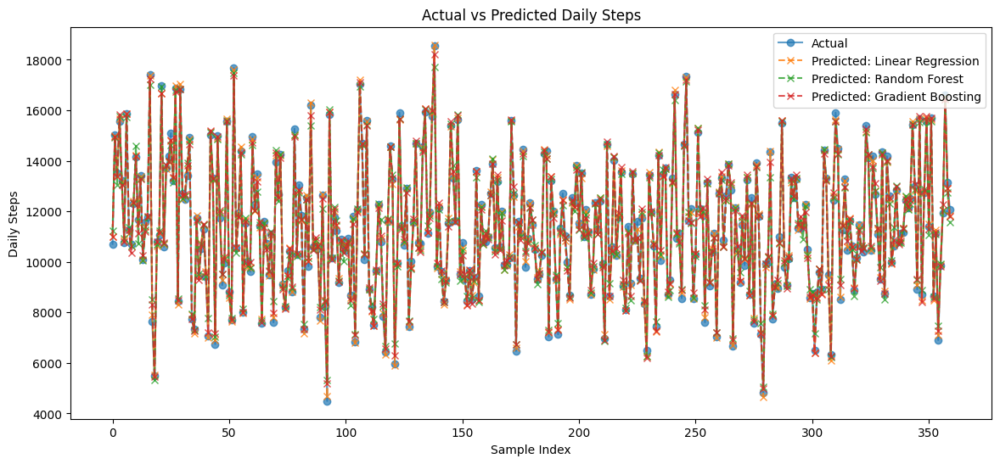

In [ ]:
# Install needed packages
!pip install scikit-learn --quiet

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load your data
df = pd.read_csv('/content/gym_members_exercise_tracking_synthetic_data.csv')

# --- Include Comprehensive Data Cleaning and Preparation Steps ---
# Fix Max_BPM (appears to be object type)
df['Max_BPM'] = pd.to_numeric(df['Max_BPM'], errors='coerce')

# Clean Workout_Type (remove entries with backslashes)
df['Workout_Type'] = df['Workout_Type'].str.strip()
df['Workout_Type'] = df['Workout_Type'].replace({r'\\nStrength': 'Strength',
                                                   r'\\tCardio': 'Cardio',
                                                   r'\\tYoga': 'Yoga'}, regex=True)

# Fill missing values in relevant columns before calculation (using median as used previously)
df['Session_Duration (hours)'].fillna(df['Session_Duration (hours)'].median(), inplace=True)
df['Calories_Burned'].fillna(df['Calories_Burned'].median(), inplace=True)
df['Experience_Level'].fillna(df['Experience_Level'].median(), inplace=True)
df['Avg_BPM'].fillna(df['Avg_BPM'].median(), inplace=True)
df['Resting_BPM'].fillna(df['Resting_BPM'].median(), inplace=True)
df['Max_BPM'].fillna(df['Max_BPM'].median(), inplace=True)

# Create synthetic data (Daily_Steps) - Ensure Daily_Steps is created
np.random.seed(42)
df['Daily_Steps'] = (df['Session_Duration (hours)'] * 6000 +
                     df['Calories_Burned'] * 3 +
                     np.random.normal(0, 500, len(df))).clip(1000, 20000).astype(int)

# Create sleep hours (based on fitness level and age) - Ensure Sleep_Hours is created
np.random.seed(42)
df['Sleep_Hours'] = (8 - (df['Experience_Level'].fillna(2) * 0.3) + # Use .fillna(2) in case Experience_Level has NaNs
                     np.random.normal(0, 0.8, len(df))).clip(4, 10)
# --- End of Comprehensive Data Cleaning and Preparation Steps ---

# Update feature names if necessary
features = ['Avg_BPM', 'Session_Duration (hours)', 'Calories_Burned', 'Sleep_Hours']
target = 'Daily_Steps'

data = df[features + [target]].dropna()
X_train, X_test, y_train, y_test = train_test_split(
    data[features], data[target], test_size=0.2, random_state=42
)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42)
}

rmses, r2s, predictions = {}, {}, {}

for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    predictions[name] = preds
    rmses[name] = np.sqrt(mean_squared_error(y_test, preds))
    r2s[name] = r2_score(y_test, preds)

# Table of results
results_df = pd.DataFrame({
    "Model": list(models.keys()),
    "RMSE": list(rmses.values()),
    "R2_Score": list(r2s.values())
})
print(results_df)

# Bar chart for RMSE and R2
fig, ax = plt.subplots(1, 2, figsize=(12,5))
results_df.plot.bar(x='Model', y='RMSE', ax=ax[0], color='skyblue', legend=False)
ax[0].set_title('Model RMSE (Lower is Better)')
ax[0].set_ylabel('RMSE')

results_df.plot.bar(x='Model', y='R2_Score', ax=ax[1], color='salmon', legend=False)
ax[1].set_title('Model R2 Score (Higher is Better)')
ax[1].set_ylabel('R2 Score')

plt.tight_layout()
plt.show()

# Actual vs predicted graph
plt.figure(figsize=(14,6))
plt.plot(range(len(y_test)), y_test.values, label='Actual', marker='o', alpha=0.7)
for name in models.keys():
    plt.plot(range(len(y_test)), predictions[name], '--', marker='x', label=f"Predicted: {name}", alpha=0.8)
plt.xlabel('Sample Index')
plt.ylabel('Daily Steps')
plt.title('Actual vs Predicted Daily Steps')
plt.legend()
plt.show()

In [ ]:
# Access the trained Linear Regression model from the models dictionary
linear_model = models["Linear Regression"]

# Get the coefficients and the feature names
coefficients = linear_model.coef_
features = X_train.columns

print("Linear Regression Model Coefficients:")
print("-" * 40)
for feature, coef in zip(features, coefficients):
    print(f"{feature:25s}: {coef:10.4f}")
print("-" * 40)

Linear Regression Model Coefficients:
----------------------------------------
Avg_BPM                  :     0.2293
Session_Duration (hours) :  5993.7144
Calories_Burned          :     2.9992
Sleep_Hours              :   567.5198
----------------------------------------
